<a href="https://colab.research.google.com/github/georgezefko/car-part-segmentation/blob/main/GAN_Interpolation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import statistics
import random
import torch
import torch.nn as nn
import torch.nn.parallel
from torch.autograd import Variable
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import glob
import cv2
import numpy
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from numpy.random import shuffle
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from skimage.transform import resize

# FID Calculations

In [ ]:
all_images_path = '/content/drive/MyDrive/Deloite_Orientation1/final_set/signle_colors'
all_car_names = [img for img in glob.glob(all_images_path + "/*.jpg")]
all_car_names.sort() # ADD THIS LINE
all_cars = []
for img in all_car_names:
    n= cv2.imread(img)
    all_cars.append(n)
img =  np.array(all_cars)  

In [ ]:
#this fucntion preprocess fake imags
def fake_pre_process(fake):
  fi = fake
  f2 = fi.permute(0,2,3,1)
  f2 = f2*255
  f2 = f2.detach().cpu()
  f2 = np.array(f2)
  f2 = f2.astype(np.uint8)
  f2 = f2.astype('float32')
  f2 = scale_images(f2, (299,299,3))
  f2 = preprocess_input(f2)
  return f2

def scale_images(images, new_shape):
	images_list = list()
	for image in images:
		# resize with nearest neighbor interpolation
		new_image = resize(image, new_shape, 0)
		# store
		images_list.append(new_image)
	return asarray(images_list)
 
# calculate frechet inception distance
def calculate_fid(model,images2):
	# calculate activations
	act2 = model.predict(images2)
	# calculate mean and covariance statistics
	mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
	# calculate sum squared difference between means
	ssdiff = numpy.sum((mu_real - mu2)**2.0)
	# calculate sqrt of product between cov
	covmean = sqrtm(sigma_real.dot(sigma2))
	# check and correct imaginary numbers from sqrt
	if iscomplexobj(covmean):
		covmean = covmean.real
	# calculate score
	fid = ssdiff + trace(sigma_real + sigma2 - 2.0 * covmean)
	return fid

In [ ]:
 # Calculate activations, mu, sigma for the real images
model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3))
images = img.astype('float32')
images = scale_images(images, (299,299,3))
images = preprocess_input(images)
act_real = model.predict(images)
mu_real = act_real.mean(axis=0) 
sigma_real  =  cov(act_real, rowvar=False)

87916544/87910968 [==============================] - 1s 0us/step


In [ ]:
# Set random seem for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)


Random Seed:  999


In [ ]:
# Root directory for dataset
#path ="/content/drive/My Drive/Deloitte_data/carseg_data/only_masks"
path = '/content/drive/MyDrive/Deloite_Orientation1/final_set'
# Number of workers for dataloader
workers = 4

# Batch size during training
# batch_size = 128
batch_size = 4

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 128

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 1500

# Learning rate for optimizers
lr_gen = 0.0002
lr_dis = 0.0002 #best so far with 0.00001

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [ ]:
dataset = dset.ImageFolder(root=path,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
  
  
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

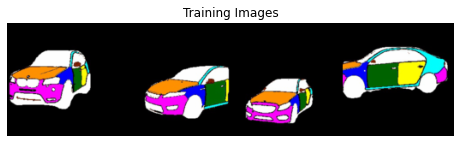

In [ ]:
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))


In [ ]:
# 

# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [ ]:
def block(ch_in, ch_out):
            conv  = nn.Sequential(
            nn.Upsample(scale_factor=2),         
            nn.Conv2d(ch_in, ch_out, 3, stride=1, padding=1),
            nn.BatchNorm2d(ch_out),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch_out, ch_out, 3, stride=1, padding=1),
            nn.BatchNorm2d(ch_out),  
            nn.LeakyReLU(0.2, inplace=True),
           
            )
            return conv
           
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.init_size = 4
        self.l1 = nn.Sequential(nn.Linear(100, 512 *4 * 4))
        self.conv_blocks = nn.Sequential(
            nn.Conv2d(512, 512, 3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 512, 3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            block(512,512),
            block(512,512),
            block(512,256),
            block(256,128),
            block(128,64),
            nn.Conv2d(64, 64, 3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 64, 3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64,3,1,1,0),
            nn.Tanh(),
        )
    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 512, self.init_size, self.init_size)
        out = self.conv_blocks(out)
        return out
cuda = True if torch.cuda.is_available() else False    
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor        


In [ ]:

# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
#netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (l1): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=True)
  )
  (conv_blocks): Sequential(
    (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Sequential(
      (0): Upsample(scale_factor=2.0, mode=nearest)
      (1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
      (4): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): BatchNorm2d(512, eps=1e-05, momentum=0.1, af

In [ ]:
def disc_block(ch_in, ch_out):
            disc_conv  = nn.Sequential (nn.Conv2d(ch_in, ch_out, 3, stride=1, padding=1),
            nn.BatchNorm2d(ch_out),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch_out, ch_out, 3, stride=1, padding=1),
            nn.BatchNorm2d(ch_out),
            nn.LeakyReLU(0.2, inplace=True),
            nn.AvgPool2d(2),
            )
            return disc_conv



class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            #input is (nc) x 128 x 128
            nn.Conv2d(nc, ndf//4, 1, stride=1, padding=0, bias=False),
            nn.LeakyReLU(0.2, inplace=True),  #[16,128,128]
#
            nn.Conv2d(ndf//4, ndf//4, 3, stride=1, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True), #[16,128,128]

            disc_block(ndf//4, ndf//2),      
            disc_block(ndf//2, ndf//1),      
            disc_block(ndf//1, ndf*2),    
            disc_block(ndf*2, ndf*4),   
            disc_block(ndf*4, ndf*8),  #[512,4,4]
            #disc_block(ndf*8, ndf*16),
            nn.Conv2d(ndf*8, ndf*8, 4, stride=1, padding=0),)
            #nn.Dropout(0.1),)  #[512,1,1]
            
            
            
        self.fc_layer = nn.Sequential(nn.Linear(ndf*8, 1), nn.Sigmoid())
        
    def forward(self, input):
      out = self.main(input)
      out = out.view(out.shape[0], -1)
      out = self.fc_layer(out)
      return out

In [ ]:
#from torch.autograd import Variable
#cuda = True if torch.cuda.is_available() else False    


#netD = Discriminator(ngpu).to(device)
#gen_imgs = netD(real_cpu) 
#print(gen_imgs.shape)

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)


Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): LeakyReLU(negative_slope=0.2, inplace=True)
      (6): AvgPool2d(kernel_size=2, stride=2, padding=0)
    )
    (5): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_r

In [ ]:
netG = Generator(ngpu).to(device)
netD = Discriminator(ngpu).to(device)
optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(beta1, 0.999))

# Initialize BCELoss function
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)



# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0


netG.train()
netD.train()
print(netG)
print(netD)


Generator(
  (l1): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=True)
  )
  (conv_blocks): Sequential(
    (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Sequential(
      (0): Upsample(scale_factor=2.0, mode=nearest)
      (1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
      (4): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): BatchNorm2d(512, eps=1e-05, momentum=0.1, af

In [ ]:
model_path = '/content/drive/MyDrive/Deloite_Orientation1/models_all/'

Starting Training Loop...
[0/1500][51/52]	Loss_D: 0.1979	Loss_G: 10.8349	D(x): 0.8467	D(G(z)): 0.0013 / 0.0009


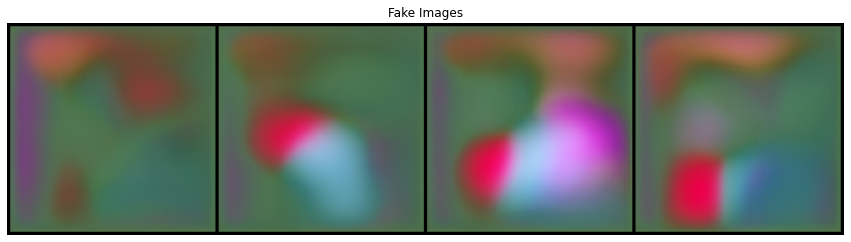

[1/1500][51/52]	Loss_D: 0.8178	Loss_G: 8.8674	D(x): 0.7603	D(G(z)): 0.0201 / 0.1051
[2/1500][51/52]	Loss_D: 0.0000	Loss_G: 13.3406	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[3/1500][51/52]	Loss_D: 0.0120	Loss_G: 20.7780	D(x): 0.9882	D(G(z)): 0.0000 / 0.0000
[4/1500][51/52]	Loss_D: 0.0000	Loss_G: 14.9903	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[5/1500][51/52]	Loss_D: 0.0028	Loss_G: 7.3740	D(x): 0.9985	D(G(z)): 0.0013 / 0.0011
[6/1500][51/52]	Loss_D: 0.0052	Loss_G: 5.9684	D(x): 0.9994	D(G(z)): 0.0046 / 0.0034
[7/1500][51/52]	Loss_D: 0.0023	Loss_G: 14.3000	D(x): 0.9977	D(G(z)): 0.0000 / 0.0000
[8/1500][51/52]	Loss_D: 0.0001	Loss_G: 12.4144	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[9/1500][51/52]	Loss_D: 0.0002	Loss_G: 12.4814	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[10/1500][51/52]	Loss_D: 0.6806	Loss_G: 10.9177	D(x): 0.6663	D(G(z)): 0.0002 / 0.0000
[11/1500][51/52]	Loss_D: 1.1757	Loss_G: 4.1581	D(x): 0.9853	D(G(z)): 0.3857 / 0.1755
[12/1500][51/52]	Loss_D: 0.0155	Loss_G: 7.5643	D(x): 0.9870	D(G(z))

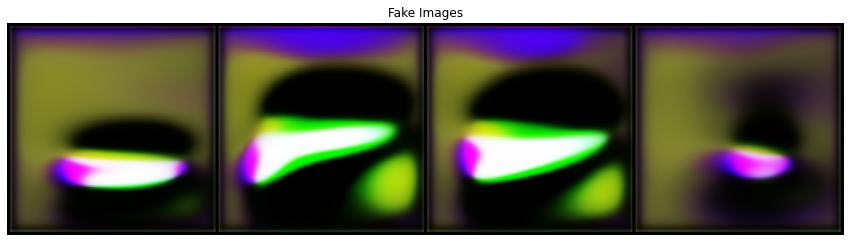

[21/1500][51/52]	Loss_D: 0.0384	Loss_G: 5.4205	D(x): 0.9972	D(G(z)): 0.0340 / 0.0092
[22/1500][51/52]	Loss_D: 0.0021	Loss_G: 7.5101	D(x): 0.9996	D(G(z)): 0.0018 / 0.0017
[23/1500][51/52]	Loss_D: 0.0033	Loss_G: 8.5266	D(x): 0.9974	D(G(z)): 0.0007 / 0.0009
[24/1500][51/52]	Loss_D: 0.0772	Loss_G: 5.7689	D(x): 0.9341	D(G(z)): 0.0041 / 0.0045
[25/1500][51/52]	Loss_D: 0.5241	Loss_G: 6.2961	D(x): 0.6335	D(G(z)): 0.0002 / 0.0023
[26/1500][51/52]	Loss_D: 0.1041	Loss_G: 9.3511	D(x): 0.9022	D(G(z)): 0.0007 / 0.0003
[27/1500][51/52]	Loss_D: 0.0626	Loss_G: 6.7188	D(x): 0.9993	D(G(z)): 0.0581 / 0.0048
[28/1500][51/52]	Loss_D: 0.3528	Loss_G: 3.9598	D(x): 0.7149	D(G(z)): 0.0130 / 0.0204
[29/1500][51/52]	Loss_D: 0.0204	Loss_G: 4.7994	D(x): 0.9987	D(G(z)): 0.0189 / 0.0109
[30/1500][51/52]	Loss_D: 0.0327	Loss_G: 5.3875	D(x): 0.9756	D(G(z)): 0.0078 / 0.0047
[31/1500][51/52]	Loss_D: 0.0061	Loss_G: 6.8218	D(x): 0.9978	D(G(z)): 0.0039 / 0.0012
[32/1500][51/52]	Loss_D: 0.4460	Loss_G: 8.4466	D(x): 0.9998	D(G(z

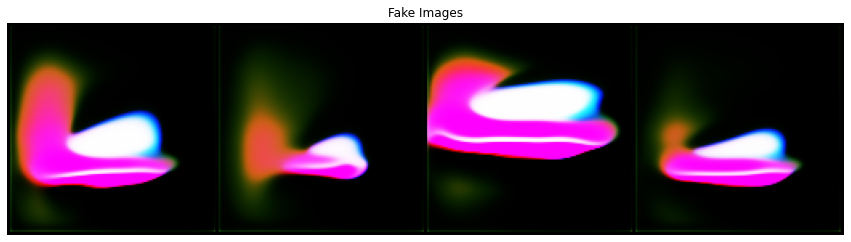

[41/1500][51/52]	Loss_D: 0.0114	Loss_G: 3.4195	D(x): 0.9991	D(G(z)): 0.0104 / 0.0372
[42/1500][51/52]	Loss_D: 0.0444	Loss_G: 4.0484	D(x): 0.9973	D(G(z)): 0.0402 / 0.0333
[43/1500][51/52]	Loss_D: 0.1406	Loss_G: 4.3673	D(x): 0.9972	D(G(z)): 0.1237 / 0.0175
[44/1500][51/52]	Loss_D: 0.0269	Loss_G: 5.0285	D(x): 0.9987	D(G(z)): 0.0248 / 0.0165
[45/1500][51/52]	Loss_D: 0.0140	Loss_G: 7.3190	D(x): 0.9886	D(G(z)): 0.0024 / 0.0009
[46/1500][51/52]	Loss_D: 0.3382	Loss_G: 4.6922	D(x): 0.8110	D(G(z)): 0.0096 / 0.0096
[47/1500][51/52]	Loss_D: 3.6020	Loss_G: 1.1124	D(x): 0.0443	D(G(z)): 0.0144 / 0.3880
[48/1500][51/52]	Loss_D: 0.0128	Loss_G: 5.8644	D(x): 0.9932	D(G(z)): 0.0059 / 0.0036
[49/1500][51/52]	Loss_D: 0.0005	Loss_G: 8.7215	D(x): 0.9998	D(G(z)): 0.0003 / 0.0004
[50/1500][51/52]	Loss_D: 0.0012	Loss_G: 14.8972	D(x): 0.9988	D(G(z)): 0.0000 / 0.0000
[51/1500][51/52]	Loss_D: 0.0739	Loss_G: 8.5605	D(x): 0.9311	D(G(z)): 0.0003 / 0.0003
[52/1500][51/52]	Loss_D: 0.0114	Loss_G: 4.8147	D(x): 0.9999	D(G(

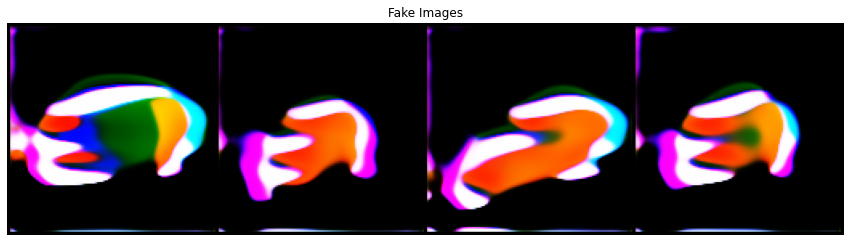

[61/1500][51/52]	Loss_D: 0.0748	Loss_G: 4.8975	D(x): 0.9304	D(G(z)): 0.0010 / 0.0084
[62/1500][51/52]	Loss_D: 0.0251	Loss_G: 5.6441	D(x): 0.9875	D(G(z)): 0.0121 / 0.0092
[63/1500][51/52]	Loss_D: 1.1416	Loss_G: 5.7553	D(x): 0.3665	D(G(z)): 0.0009 / 0.0083
[64/1500][51/52]	Loss_D: 0.2480	Loss_G: 1.8427	D(x): 0.7961	D(G(z)): 0.0130 / 0.1673
[65/1500][51/52]	Loss_D: 0.1239	Loss_G: 10.9683	D(x): 0.8927	D(G(z)): 0.0002 / 0.0000
[66/1500][51/52]	Loss_D: 0.1883	Loss_G: 4.4390	D(x): 0.9961	D(G(z)): 0.1580 / 0.0172
[67/1500][51/52]	Loss_D: 0.0020	Loss_G: 6.9296	D(x): 0.9995	D(G(z)): 0.0015 / 0.0011
[68/1500][51/52]	Loss_D: 0.0093	Loss_G: 5.4006	D(x): 0.9997	D(G(z)): 0.0089 / 0.0051
[69/1500][51/52]	Loss_D: 0.0064	Loss_G: 9.9176	D(x): 0.9937	D(G(z)): 0.0001 / 0.0001
[70/1500][51/52]	Loss_D: 0.0086	Loss_G: 10.8362	D(x): 0.9916	D(G(z)): 0.0000 / 0.0000
[71/1500][51/52]	Loss_D: 0.0407	Loss_G: 5.1200	D(x): 0.9997	D(G(z)): 0.0394 / 0.0066
[72/1500][51/52]	Loss_D: 0.0008	Loss_G: 14.5329	D(x): 0.9992	D(

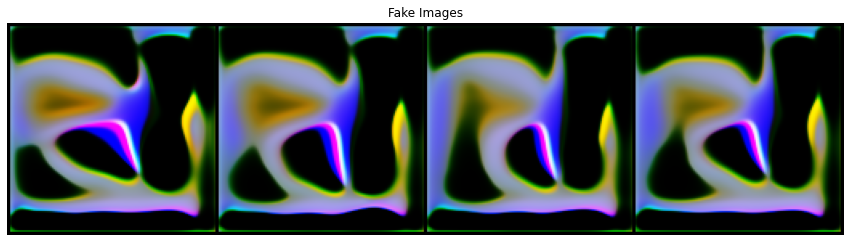

[81/1500][51/52]	Loss_D: 0.0123	Loss_G: 4.9077	D(x): 0.9990	D(G(z)): 0.0112 / 0.0079
[82/1500][51/52]	Loss_D: 0.7103	Loss_G: 9.8758	D(x): 0.5595	D(G(z)): 0.0000 / 0.0001
[83/1500][51/52]	Loss_D: 0.0256	Loss_G: 5.0582	D(x): 0.9947	D(G(z)): 0.0200 / 0.0076
[84/1500][51/52]	Loss_D: 0.0402	Loss_G: 7.0464	D(x): 0.9622	D(G(z)): 0.0015 / 0.0012
[85/1500][51/52]	Loss_D: 0.0385	Loss_G: 5.3731	D(x): 0.9694	D(G(z)): 0.0064 / 0.0058
[86/1500][51/52]	Loss_D: 0.0065	Loss_G: 5.3588	D(x): 0.9999	D(G(z)): 0.0063 / 0.0049
[87/1500][51/52]	Loss_D: 3.1524	Loss_G: 6.1815	D(x): 0.1795	D(G(z)): 0.0001 / 0.0023
[88/1500][51/52]	Loss_D: 0.0357	Loss_G: 5.9141	D(x): 0.9671	D(G(z)): 0.0022 / 0.0048
[89/1500][51/52]	Loss_D: 0.0130	Loss_G: 4.9132	D(x): 0.9975	D(G(z)): 0.0104 / 0.0078
[90/1500][51/52]	Loss_D: 0.0086	Loss_G: 6.3614	D(x): 0.9933	D(G(z)): 0.0019 / 0.0019
[91/1500][51/52]	Loss_D: 0.0264	Loss_G: 5.7897	D(x): 0.9778	D(G(z)): 0.0039 / 0.0032
[92/1500][51/52]	Loss_D: 0.0017	Loss_G: 7.5468	D(x): 0.9994	D(G(z

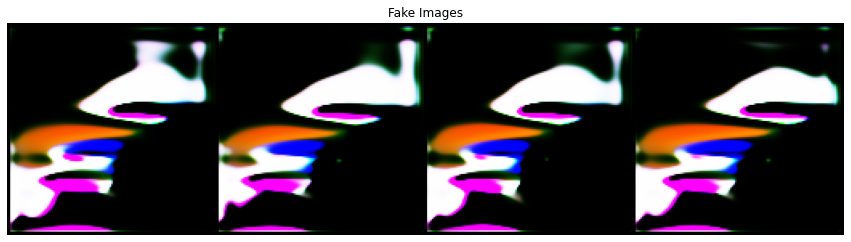

[101/1500][51/52]	Loss_D: 0.0090	Loss_G: 5.4252	D(x): 0.9999	D(G(z)): 0.0088 / 0.0049
[102/1500][51/52]	Loss_D: 0.0038	Loss_G: 5.7863	D(x): 1.0000	D(G(z)): 0.0038 / 0.0032
[103/1500][51/52]	Loss_D: 0.0065	Loss_G: 5.6400	D(x): 1.0000	D(G(z)): 0.0065 / 0.0038
[104/1500][51/52]	Loss_D: 0.0101	Loss_G: 12.0968	D(x): 0.9901	D(G(z)): 0.0000 / 0.0000
[105/1500][51/52]	Loss_D: 0.0009	Loss_G: 7.3767	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[106/1500][51/52]	Loss_D: 0.0079	Loss_G: 6.6319	D(x): 0.9946	D(G(z)): 0.0024 / 0.0017
[107/1500][51/52]	Loss_D: 0.0051	Loss_G: 7.7078	D(x): 0.9972	D(G(z)): 0.0024 / 0.0005
[108/1500][51/52]	Loss_D: 0.0051	Loss_G: 15.4000	D(x): 0.9950	D(G(z)): 0.0000 / 0.0000
[109/1500][51/52]	Loss_D: 0.0043	Loss_G: 5.9496	D(x): 0.9996	D(G(z)): 0.0039 / 0.0031
[110/1500][51/52]	Loss_D: 0.0012	Loss_G: 8.0374	D(x): 0.9991	D(G(z)): 0.0003 / 0.0003
[111/1500][51/52]	Loss_D: 0.0203	Loss_G: 19.8120	D(x): 0.9804	D(G(z)): 0.0000 / 0.0000
[112/1500][51/52]	Loss_D: 0.0004	Loss_G: 7.9879	D(x

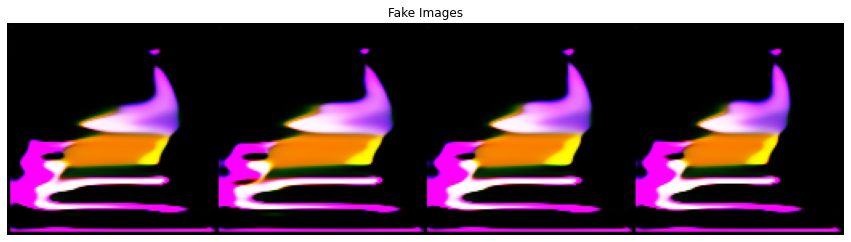

[121/1500][51/52]	Loss_D: 0.0035	Loss_G: 6.4344	D(x): 0.9994	D(G(z)): 0.0029 / 0.0019
[122/1500][51/52]	Loss_D: 0.0147	Loss_G: 5.1556	D(x): 0.9942	D(G(z)): 0.0089 / 0.0062
[123/1500][51/52]	Loss_D: 0.0027	Loss_G: 7.8243	D(x): 0.9978	D(G(z)): 0.0005 / 0.0004
[124/1500][51/52]	Loss_D: 0.0023	Loss_G: 6.7273	D(x): 0.9995	D(G(z)): 0.0018 / 0.0015
[125/1500][51/52]	Loss_D: 0.0018	Loss_G: 6.8677	D(x): 0.9999	D(G(z)): 0.0017 / 0.0011
[126/1500][51/52]	Loss_D: 0.0084	Loss_G: 5.3609	D(x): 0.9995	D(G(z)): 0.0079 / 0.0053
[127/1500][51/52]	Loss_D: 0.0070	Loss_G: 5.5568	D(x): 0.9987	D(G(z)): 0.0057 / 0.0041
[128/1500][51/52]	Loss_D: 0.0545	Loss_G: 3.4154	D(x): 0.9983	D(G(z)): 0.0513 / 0.0333
[129/1500][51/52]	Loss_D: 0.0001	Loss_G: 13.2494	D(x): 0.9999	D(G(z)): 0.0001 / 0.0000
[130/1500][51/52]	Loss_D: 0.0198	Loss_G: 7.5897	D(x): 0.9812	D(G(z)): 0.0006 / 0.0005
[131/1500][51/52]	Loss_D: 0.0024	Loss_G: 6.2252	D(x): 0.9990	D(G(z)): 0.0014 / 0.0023
[132/1500][51/52]	Loss_D: 0.0161	Loss_G: 5.1520	D(x):

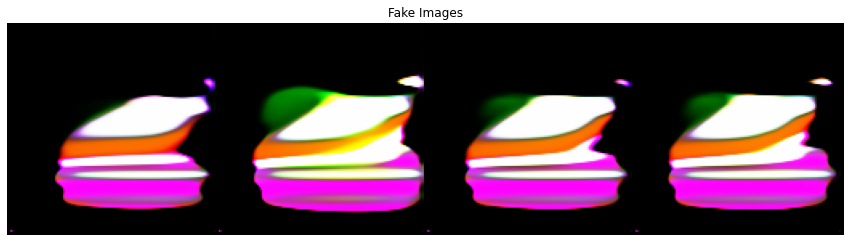

[141/1500][51/52]	Loss_D: 0.0007	Loss_G: 4.2339	D(x): 1.0000	D(G(z)): 0.0006 / 0.0579
[142/1500][51/52]	Loss_D: 0.0046	Loss_G: 6.2149	D(x): 0.9999	D(G(z)): 0.0045 / 0.0020
[143/1500][51/52]	Loss_D: 0.0176	Loss_G: 6.2098	D(x): 0.9848	D(G(z)): 0.0022 / 0.0021
[144/1500][51/52]	Loss_D: 1.3971	Loss_G: 6.0451	D(x): 0.3079	D(G(z)): 0.0002 / 0.0024
[145/1500][51/52]	Loss_D: 0.0109	Loss_G: 5.1029	D(x): 0.9994	D(G(z)): 0.0103 / 0.0068
[146/1500][51/52]	Loss_D: 0.0104	Loss_G: 6.1817	D(x): 1.0000	D(G(z)): 0.0104 / 0.0030
[147/1500][51/52]	Loss_D: 0.0794	Loss_G: 5.7240	D(x): 0.9897	D(G(z)): 0.0630 / 0.0192
[148/1500][51/52]	Loss_D: 0.0006	Loss_G: 6.6831	D(x): 1.0000	D(G(z)): 0.0006 / 0.0013
[149/1500][51/52]	Loss_D: 0.0175	Loss_G: 5.4124	D(x): 0.9995	D(G(z)): 0.0168 / 0.0067
[150/1500][51/52]	Loss_D: 0.0103	Loss_G: 8.5509	D(x): 0.9916	D(G(z)): 0.0019 / 0.0014
[151/1500][51/52]	Loss_D: 0.0337	Loss_G: 8.5862	D(x): 0.9672	D(G(z)): 0.0001 / 0.0002
[152/1500][51/52]	Loss_D: 0.0105	Loss_G: 5.0531	D(x): 

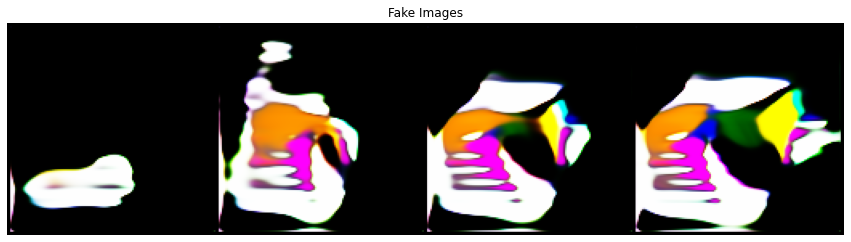

[161/1500][51/52]	Loss_D: 0.0060	Loss_G: 8.6520	D(x): 0.9944	D(G(z)): 0.0003 / 0.0003
[162/1500][51/52]	Loss_D: 0.2598	Loss_G: 2.8676	D(x): 0.8773	D(G(z)): 0.1083 / 0.0816
[163/1500][51/52]	Loss_D: 0.0017	Loss_G: 7.1832	D(x): 0.9986	D(G(z)): 0.0003 / 0.0008
[164/1500][51/52]	Loss_D: 0.0892	Loss_G: 3.1709	D(x): 0.9896	D(G(z)): 0.0744 / 0.0612
[165/1500][51/52]	Loss_D: 0.0537	Loss_G: 12.8959	D(x): 0.9497	D(G(z)): 0.0001 / 0.0000
[166/1500][51/52]	Loss_D: 0.1771	Loss_G: 4.5805	D(x): 0.8473	D(G(z)): 0.0087 / 0.0195
[167/1500][51/52]	Loss_D: 0.0139	Loss_G: 6.6844	D(x): 0.9915	D(G(z)): 0.0054 / 0.0015
[168/1500][51/52]	Loss_D: 0.0120	Loss_G: 5.2207	D(x): 0.9988	D(G(z)): 0.0108 / 0.0076
[169/1500][51/52]	Loss_D: 0.2341	Loss_G: 6.0298	D(x): 0.7970	D(G(z)): 0.0049 / 0.0025
[170/1500][51/52]	Loss_D: 0.0095	Loss_G: 6.9802	D(x): 0.9916	D(G(z)): 0.0011 / 0.0012
[171/1500][51/52]	Loss_D: 0.0015	Loss_G: 8.3573	D(x): 0.9988	D(G(z)): 0.0003 / 0.0003
[172/1500][51/52]	Loss_D: 0.0477	Loss_G: 4.3519	D(x):

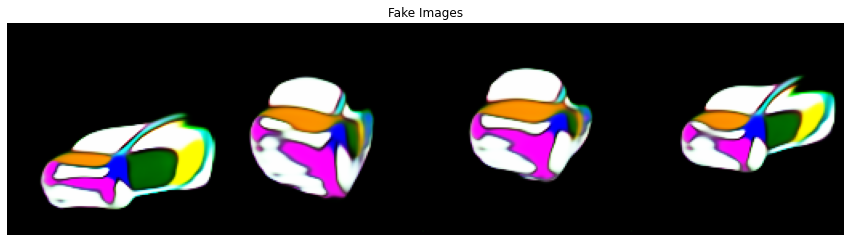

[181/1500][51/52]	Loss_D: 0.1431	Loss_G: 5.2141	D(x): 0.8733	D(G(z)): 0.0027 / 0.0063
[182/1500][51/52]	Loss_D: 0.8821	Loss_G: 11.7561	D(x): 0.9997	D(G(z)): 0.5361 / 0.0000
[183/1500][51/52]	Loss_D: 0.0560	Loss_G: 6.5192	D(x): 0.9505	D(G(z)): 0.0032 / 0.0024
[184/1500][51/52]	Loss_D: 0.0005	Loss_G: 9.9194	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[185/1500][51/52]	Loss_D: 0.0742	Loss_G: 4.0541	D(x): 0.9520	D(G(z)): 0.0220 / 0.0218
[186/1500][51/52]	Loss_D: 0.0171	Loss_G: 4.7557	D(x): 0.9998	D(G(z)): 0.0166 / 0.0121
[187/1500][51/52]	Loss_D: 0.0370	Loss_G: 7.1600	D(x): 0.9666	D(G(z)): 0.0021 / 0.0019
[188/1500][51/52]	Loss_D: 0.0216	Loss_G: 5.1143	D(x): 0.9952	D(G(z)): 0.0166 / 0.0077
[189/1500][51/52]	Loss_D: 0.0621	Loss_G: 9.0945	D(x): 0.9413	D(G(z)): 0.0002 / 0.0004
[190/1500][51/52]	Loss_D: 0.1594	Loss_G: 3.2319	D(x): 0.9996	D(G(z)): 0.1450 / 0.0420
[191/1500][51/52]	Loss_D: 0.1333	Loss_G: 4.5081	D(x): 0.9097	D(G(z)): 0.0364 / 0.0124
[192/1500][51/52]	Loss_D: 0.0213	Loss_G: 10.0305	D(x)

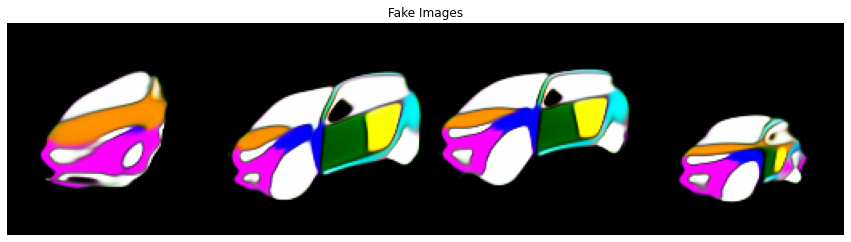

[201/1500][51/52]	Loss_D: 0.0318	Loss_G: 3.8931	D(x): 0.9968	D(G(z)): 0.0282 / 0.0231
[202/1500][51/52]	Loss_D: 0.0747	Loss_G: 5.1523	D(x): 0.9905	D(G(z)): 0.0627 / 0.0067
[203/1500][51/52]	Loss_D: 0.0153	Loss_G: 7.8906	D(x): 0.9863	D(G(z)): 0.0014 / 0.0011
[204/1500][51/52]	Loss_D: 0.0181	Loss_G: 7.9492	D(x): 0.9825	D(G(z)): 0.0002 / 0.0004
[205/1500][51/52]	Loss_D: 0.2665	Loss_G: 4.2538	D(x): 0.9940	D(G(z)): 0.2187 / 0.0156
[206/1500][51/52]	Loss_D: 0.7757	Loss_G: 2.9571	D(x): 0.5329	D(G(z)): 0.0065 / 0.0913
[207/1500][51/52]	Loss_D: 0.8570	Loss_G: 1.6077	D(x): 0.4765	D(G(z)): 0.0107 / 0.3053
[208/1500][51/52]	Loss_D: 0.1205	Loss_G: 3.5665	D(x): 0.9968	D(G(z)): 0.1077 / 0.0335
[209/1500][51/52]	Loss_D: 0.0237	Loss_G: 9.0357	D(x): 0.9769	D(G(z)): 0.0002 / 0.0002
[210/1500][51/52]	Loss_D: 0.0017	Loss_G: 7.0073	D(x): 0.9999	D(G(z)): 0.0016 / 0.0015
[211/1500][51/52]	Loss_D: 0.0077	Loss_G: 9.2167	D(x): 0.9986	D(G(z)): 0.0062 / 0.0035
[212/1500][51/52]	Loss_D: 0.0090	Loss_G: 6.3951	D(x): 

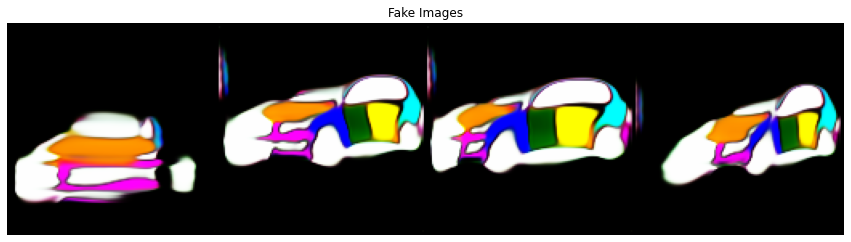

[221/1500][51/52]	Loss_D: 0.6305	Loss_G: 2.4879	D(x): 0.6573	D(G(z)): 0.0945 / 0.0999
[222/1500][51/52]	Loss_D: 1.1853	Loss_G: 2.7995	D(x): 0.7720	D(G(z)): 0.3603 / 0.1398
[223/1500][51/52]	Loss_D: 0.0387	Loss_G: 5.2326	D(x): 0.9701	D(G(z)): 0.0082 / 0.0065
[224/1500][51/52]	Loss_D: 4.4848	Loss_G: 3.1141	D(x): 0.1513	D(G(z)): 0.0004 / 0.2237
[225/1500][51/52]	Loss_D: 0.2248	Loss_G: 4.3226	D(x): 0.8286	D(G(z)): 0.0177 / 0.0207
[226/1500][51/52]	Loss_D: 0.1250	Loss_G: 4.7763	D(x): 0.8909	D(G(z)): 0.0035 / 0.0109
[227/1500][51/52]	Loss_D: 0.1357	Loss_G: 4.0427	D(x): 0.9999	D(G(z)): 0.1190 / 0.0197
[228/1500][51/52]	Loss_D: 0.2609	Loss_G: 3.8344	D(x): 0.9827	D(G(z)): 0.1780 / 0.0505
[229/1500][51/52]	Loss_D: 0.2618	Loss_G: 3.2244	D(x): 0.9907	D(G(z)): 0.2079 / 0.0507
[230/1500][51/52]	Loss_D: 0.0347	Loss_G: 5.4407	D(x): 0.9775	D(G(z)): 0.0118 / 0.0096
[231/1500][51/52]	Loss_D: 0.1542	Loss_G: 4.6275	D(x): 0.9955	D(G(z)): 0.1326 / 0.0169
[232/1500][51/52]	Loss_D: 0.2204	Loss_G: 3.8285	D(x): 

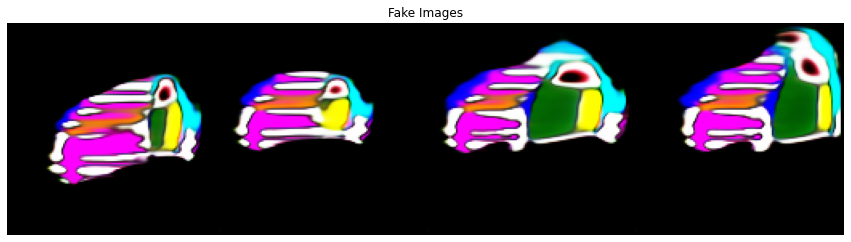

[241/1500][51/52]	Loss_D: 0.0005	Loss_G: 10.1798	D(x): 0.9997	D(G(z)): 0.0002 / 0.0001
[242/1500][51/52]	Loss_D: 0.0256	Loss_G: 5.5078	D(x): 0.9919	D(G(z)): 0.0172 / 0.0066
[243/1500][51/52]	Loss_D: 1.6346	Loss_G: 4.3265	D(x): 0.9957	D(G(z)): 0.7697 / 0.0143
[244/1500][51/52]	Loss_D: 0.0849	Loss_G: 4.2831	D(x): 0.9666	D(G(z)): 0.0484 / 0.0295
[245/1500][51/52]	Loss_D: 0.1423	Loss_G: 7.3145	D(x): 0.8700	D(G(z)): 0.0007 / 0.0011
[246/1500][51/52]	Loss_D: 0.1203	Loss_G: 4.7983	D(x): 0.9995	D(G(z)): 0.1001 / 0.0141
[247/1500][51/52]	Loss_D: 0.0186	Loss_G: 5.1292	D(x): 0.9932	D(G(z)): 0.0117 / 0.0093
[248/1500][51/52]	Loss_D: 0.0056	Loss_G: 6.6505	D(x): 0.9977	D(G(z)): 0.0033 / 0.0038
[249/1500][51/52]	Loss_D: 0.1034	Loss_G: 4.9727	D(x): 0.9997	D(G(z)): 0.0948 / 0.0083
[250/1500][51/52]	Loss_D: 3.7569	Loss_G: 4.0647	D(x): 0.0330	D(G(z)): 0.0000 / 0.0504
[251/1500][51/52]	Loss_D: 0.0772	Loss_G: 4.3968	D(x): 0.9635	D(G(z)): 0.0385 / 0.0151
[252/1500][51/52]	Loss_D: 0.8091	Loss_G: 2.2856	D(x):

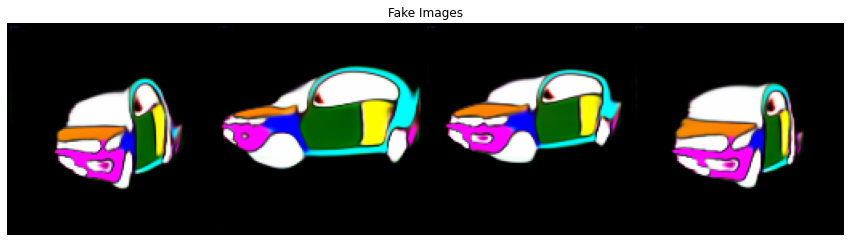

[261/1500][51/52]	Loss_D: 0.0004	Loss_G: 12.3173	D(x): 0.9999	D(G(z)): 0.0003 / 0.0000
[262/1500][51/52]	Loss_D: 0.0680	Loss_G: 3.7054	D(x): 0.9522	D(G(z)): 0.0166 / 0.0374
[263/1500][51/52]	Loss_D: 0.0719	Loss_G: 5.2843	D(x): 0.9995	D(G(z)): 0.0677 / 0.0072
[264/1500][51/52]	Loss_D: 0.0035	Loss_G: 11.8429	D(x): 0.9966	D(G(z)): 0.0001 / 0.0000
[265/1500][51/52]	Loss_D: 0.0019	Loss_G: 7.3319	D(x): 0.9991	D(G(z)): 0.0009 / 0.0008
[266/1500][51/52]	Loss_D: 0.0167	Loss_G: 4.6074	D(x): 0.9957	D(G(z)): 0.0122 / 0.0125
[267/1500][51/52]	Loss_D: 0.0190	Loss_G: 5.0710	D(x): 0.9911	D(G(z)): 0.0100 / 0.0081
[268/1500][51/52]	Loss_D: 0.0129	Loss_G: 6.8926	D(x): 0.9918	D(G(z)): 0.0046 / 0.0029
[269/1500][51/52]	Loss_D: 0.1871	Loss_G: 5.9524	D(x): 0.8322	D(G(z)): 0.0026 / 0.0045
[270/1500][51/52]	Loss_D: 0.3250	Loss_G: 5.6314	D(x): 0.7257	D(G(z)): 0.0006 / 0.0043
[271/1500][51/52]	Loss_D: 0.0087	Loss_G: 12.1274	D(x): 0.9921	D(G(z)): 0.0008 / 0.0000
[272/1500][51/52]	Loss_D: 0.2078	Loss_G: 8.0446	D(x

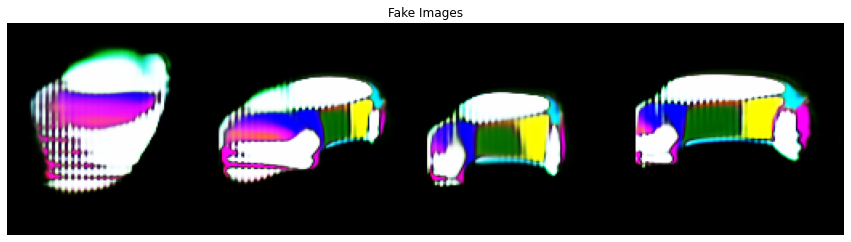

[281/1500][51/52]	Loss_D: 0.0077	Loss_G: 5.3831	D(x): 0.9991	D(G(z)): 0.0068 / 0.0050
[282/1500][51/52]	Loss_D: 0.0020	Loss_G: 7.6616	D(x): 0.9991	D(G(z)): 0.0011 / 0.0009
[283/1500][51/52]	Loss_D: 0.0057	Loss_G: 6.0336	D(x): 0.9988	D(G(z)): 0.0045 / 0.0030
[284/1500][51/52]	Loss_D: 0.0082	Loss_G: 5.8620	D(x): 0.9998	D(G(z)): 0.0079 / 0.0049
[285/1500][51/52]	Loss_D: 0.0706	Loss_G: 7.2394	D(x): 0.9987	D(G(z)): 0.0614 / 0.0029
[286/1500][51/52]	Loss_D: 0.0013	Loss_G: 8.1368	D(x): 0.9995	D(G(z)): 0.0008 / 0.0008
[287/1500][51/52]	Loss_D: 0.0027	Loss_G: 15.1916	D(x): 0.9973	D(G(z)): 0.0000 / 0.0000
[288/1500][51/52]	Loss_D: 0.0048	Loss_G: 6.4298	D(x): 1.0000	D(G(z)): 0.0048 / 0.0027
[289/1500][51/52]	Loss_D: 0.0022	Loss_G: 12.1454	D(x): 0.9979	D(G(z)): 0.0001 / 0.0000
[290/1500][51/52]	Loss_D: 0.0737	Loss_G: 3.1870	D(x): 0.9995	D(G(z)): 0.0676 / 0.1236
[291/1500][51/52]	Loss_D: 0.0273	Loss_G: 24.9974	D(x): 0.9739	D(G(z)): 0.0000 / 0.0000
[292/1500][51/52]	Loss_D: 1.0662	Loss_G: 3.7555	D(x

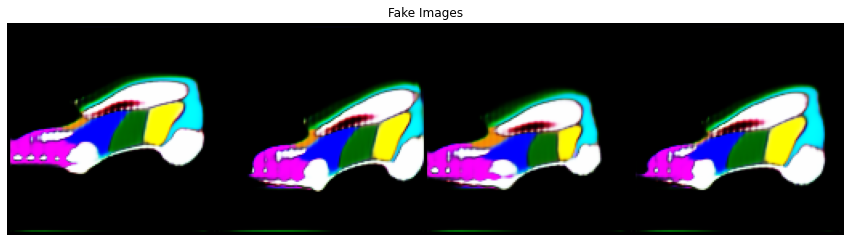

[301/1500][51/52]	Loss_D: 0.0371	Loss_G: 6.0801	D(x): 0.9661	D(G(z)): 0.0023 / 0.0029
[302/1500][51/52]	Loss_D: 0.0060	Loss_G: 12.9609	D(x): 0.9941	D(G(z)): 0.0000 / 0.0000
[303/1500][51/52]	Loss_D: 0.1281	Loss_G: 6.0317	D(x): 0.9993	D(G(z)): 0.1161 / 0.0027
[304/1500][51/52]	Loss_D: 0.0590	Loss_G: 4.4940	D(x): 0.9999	D(G(z)): 0.0552 / 0.0170
[305/1500][51/52]	Loss_D: 0.1452	Loss_G: 4.1166	D(x): 0.8745	D(G(z)): 0.0090 / 0.0228
[306/1500][51/52]	Loss_D: 0.0592	Loss_G: 8.9664	D(x): 0.9456	D(G(z)): 0.0016 / 0.0008
[307/1500][51/52]	Loss_D: 0.0312	Loss_G: 6.2080	D(x): 0.9722	D(G(z)): 0.0028 / 0.0023
[308/1500][51/52]	Loss_D: 0.0178	Loss_G: 7.1365	D(x): 0.9833	D(G(z)): 0.0008 / 0.0010
[309/1500][51/52]	Loss_D: 0.0100	Loss_G: 5.6720	D(x): 0.9983	D(G(z)): 0.0082 / 0.0066
[310/1500][51/52]	Loss_D: 0.0075	Loss_G: 5.2153	D(x): 0.9999	D(G(z)): 0.0074 / 0.0060
[311/1500][51/52]	Loss_D: 0.0017	Loss_G: 7.7300	D(x): 0.9997	D(G(z)): 0.0014 / 0.0006
[312/1500][51/52]	Loss_D: 0.0079	Loss_G: 6.5815	D(x):

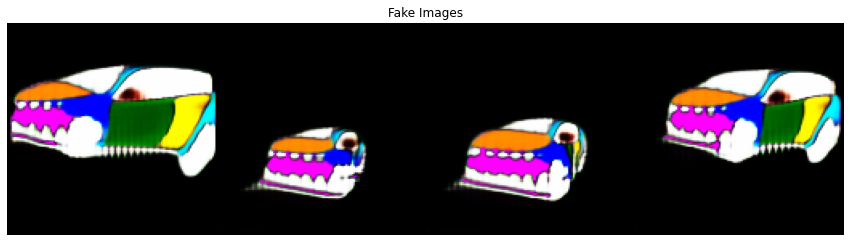

[321/1500][51/52]	Loss_D: 0.1160	Loss_G: 5.8138	D(x): 0.8933	D(G(z)): 0.0016 / 0.0045
[322/1500][51/52]	Loss_D: 0.0381	Loss_G: 5.3583	D(x): 0.9888	D(G(z)): 0.0261 / 0.0071
[323/1500][51/52]	Loss_D: 0.0377	Loss_G: 8.6774	D(x): 0.9642	D(G(z)): 0.0005 / 0.0006
[324/1500][51/52]	Loss_D: 0.0154	Loss_G: 5.0510	D(x): 0.9952	D(G(z)): 0.0105 / 0.0132
[325/1500][51/52]	Loss_D: 0.0016	Loss_G: 7.5759	D(x): 0.9998	D(G(z)): 0.0014 / 0.0010
[326/1500][51/52]	Loss_D: 0.0575	Loss_G: 11.3379	D(x): 0.9444	D(G(z)): 0.0000 / 0.0000
[327/1500][51/52]	Loss_D: 0.0395	Loss_G: 4.7234	D(x): 0.9999	D(G(z)): 0.0379 / 0.0127
[328/1500][51/52]	Loss_D: 0.5783	Loss_G: 4.7293	D(x): 0.9904	D(G(z)): 0.4197 / 0.0101
[329/1500][51/52]	Loss_D: 0.0210	Loss_G: 8.5936	D(x): 0.9816	D(G(z)): 0.0023 / 0.0004
[330/1500][51/52]	Loss_D: 0.0492	Loss_G: 5.3449	D(x): 0.9953	D(G(z)): 0.0430 / 0.0063
[331/1500][51/52]	Loss_D: 0.0041	Loss_G: 6.4220	D(x): 1.0000	D(G(z)): 0.0041 / 0.0037
[332/1500][51/52]	Loss_D: 0.0325	Loss_G: 5.1141	D(x):

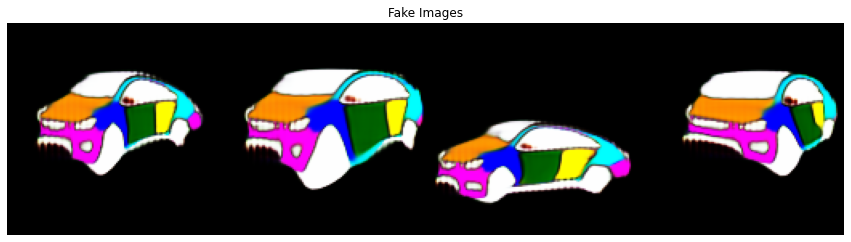

[341/1500][51/52]	Loss_D: 0.0018	Loss_G: 10.3031	D(x): 0.9983	D(G(z)): 0.0001 / 0.0001
[342/1500][51/52]	Loss_D: 0.0005	Loss_G: 9.2918	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[343/1500][51/52]	Loss_D: 0.5774	Loss_G: 5.4735	D(x): 0.9948	D(G(z)): 0.3293 / 0.0059
[344/1500][51/52]	Loss_D: 0.0047	Loss_G: 8.4390	D(x): 0.9962	D(G(z)): 0.0009 / 0.0007
[345/1500][51/52]	Loss_D: 0.0094	Loss_G: 6.2042	D(x): 0.9949	D(G(z)): 0.0042 / 0.0031
[346/1500][51/52]	Loss_D: 0.0123	Loss_G: 6.9734	D(x): 0.9936	D(G(z)): 0.0058 / 0.0024
[347/1500][51/52]	Loss_D: 0.0375	Loss_G: 8.7800	D(x): 0.9668	D(G(z)): 0.0024 / 0.0004
[348/1500][51/52]	Loss_D: 0.0079	Loss_G: 8.4408	D(x): 0.9925	D(G(z)): 0.0004 / 0.0003
[349/1500][51/52]	Loss_D: 0.0037	Loss_G: 7.4480	D(x): 0.9975	D(G(z)): 0.0012 / 0.0008
[350/1500][51/52]	Loss_D: 0.0222	Loss_G: 6.3896	D(x): 0.9815	D(G(z)): 0.0033 / 0.0028
[351/1500][51/52]	Loss_D: 0.0005	Loss_G: 9.7984	D(x): 0.9997	D(G(z)): 0.0002 / 0.0001
[352/1500][51/52]	Loss_D: 0.0684	Loss_G: 5.7506	D(x):

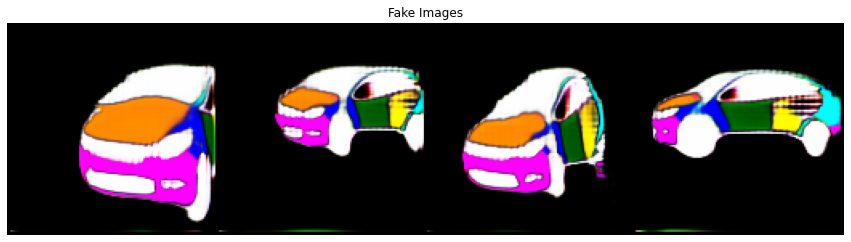

[361/1500][51/52]	Loss_D: 0.0750	Loss_G: 4.3680	D(x): 0.9973	D(G(z)): 0.0677 / 0.0165
[362/1500][51/52]	Loss_D: 0.0020	Loss_G: 7.6281	D(x): 0.9990	D(G(z)): 0.0010 / 0.0007
[363/1500][51/52]	Loss_D: 0.0797	Loss_G: 2.8499	D(x): 0.9893	D(G(z)): 0.0664 / 0.0604
[364/1500][51/52]	Loss_D: 0.0623	Loss_G: 6.6436	D(x): 0.9564	D(G(z)): 0.0167 / 0.0082
[365/1500][51/52]	Loss_D: 0.0356	Loss_G: 6.9605	D(x): 0.9665	D(G(z)): 0.0013 / 0.0015
[366/1500][51/52]	Loss_D: 0.0011	Loss_G: 9.0468	D(x): 0.9991	D(G(z)): 0.0003 / 0.0004
[367/1500][51/52]	Loss_D: 0.0274	Loss_G: 9.2379	D(x): 0.9736	D(G(z)): 0.0001 / 0.0001
[368/1500][51/52]	Loss_D: 0.0340	Loss_G: 3.8574	D(x): 0.9981	D(G(z)): 0.0316 / 0.0225
[369/1500][51/52]	Loss_D: 0.3330	Loss_G: 5.3408	D(x): 0.8027	D(G(z)): 0.0017 / 0.0084
[370/1500][51/52]	Loss_D: 0.0017	Loss_G: 7.9853	D(x): 0.9999	D(G(z)): 0.0017 / 0.0005
[371/1500][51/52]	Loss_D: 0.7326	Loss_G: 0.2669	D(x): 0.5002	D(G(z)): 0.0012 / 0.7883
[372/1500][51/52]	Loss_D: 0.3562	Loss_G: 6.2314	D(x): 

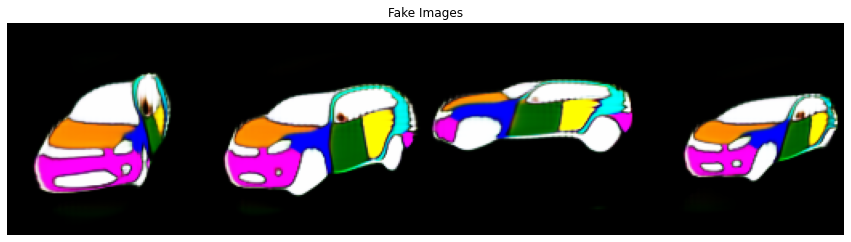

[381/1500][51/52]	Loss_D: 0.0014	Loss_G: 7.7239	D(x): 0.9995	D(G(z)): 0.0009 / 0.0008
[382/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.4494	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[383/1500][51/52]	Loss_D: 0.4123	Loss_G: 6.8519	D(x): 0.7151	D(G(z)): 0.0001 / 0.0022
[384/1500][51/52]	Loss_D: 0.0415	Loss_G: 8.4596	D(x): 0.9616	D(G(z)): 0.0017 / 0.0006
[385/1500][51/52]	Loss_D: 0.1425	Loss_G: 7.6888	D(x): 0.8730	D(G(z)): 0.0001 / 0.0011
[386/1500][51/52]	Loss_D: 0.1022	Loss_G: 5.1980	D(x): 0.9134	D(G(z)): 0.0067 / 0.0102
[387/1500][51/52]	Loss_D: 0.0464	Loss_G: 10.2613	D(x): 0.9551	D(G(z)): 0.0001 / 0.0002
[388/1500][51/52]	Loss_D: 0.0948	Loss_G: 4.9039	D(x): 0.9524	D(G(z)): 0.0427 / 0.0203
[389/1500][51/52]	Loss_D: 0.0075	Loss_G: 6.5403	D(x): 0.9991	D(G(z)): 0.0066 / 0.0034
[390/1500][51/52]	Loss_D: 0.0330	Loss_G: 6.0062	D(x): 0.9771	D(G(z)): 0.0093 / 0.0077
[391/1500][51/52]	Loss_D: 0.4773	Loss_G: 4.3465	D(x): 0.9963	D(G(z)): 0.2633 / 0.0430
[392/1500][51/52]	Loss_D: 0.0048	Loss_G: 6.2991	D(x)

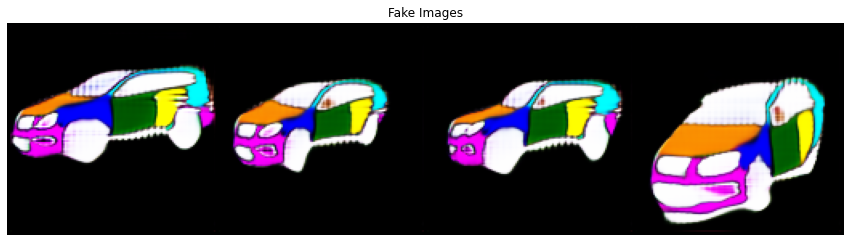

[401/1500][51/52]	Loss_D: 0.0932	Loss_G: 6.6826	D(x): 0.9220	D(G(z)): 0.0018 / 0.0043
[402/1500][51/52]	Loss_D: 0.3053	Loss_G: 2.0511	D(x): 0.9927	D(G(z)): 0.2414 / 0.1545
[403/1500][51/52]	Loss_D: 1.7815	Loss_G: 8.5693	D(x): 1.0000	D(G(z)): 0.7094 / 0.0002
[404/1500][51/52]	Loss_D: 0.0012	Loss_G: 9.3858	D(x): 0.9993	D(G(z)): 0.0006 / 0.0005
[405/1500][51/52]	Loss_D: 0.1181	Loss_G: 11.6946	D(x): 0.8941	D(G(z)): 0.0001 / 0.0000
[406/1500][51/52]	Loss_D: 0.4947	Loss_G: 7.5039	D(x): 0.9973	D(G(z)): 0.3329 / 0.0006
[407/1500][51/52]	Loss_D: 0.0002	Loss_G: 11.0013	D(x): 1.0000	D(G(z)): 0.0001 / 0.0002
[408/1500][51/52]	Loss_D: 0.0235	Loss_G: 5.8973	D(x): 0.9885	D(G(z)): 0.0117 / 0.0059
[409/1500][51/52]	Loss_D: 0.0099	Loss_G: 6.6466	D(x): 0.9994	D(G(z)): 0.0092 / 0.0053
[410/1500][51/52]	Loss_D: 0.0278	Loss_G: 8.7588	D(x): 0.9733	D(G(z)): 0.0005 / 0.0004
[411/1500][51/52]	Loss_D: 0.0558	Loss_G: 5.2970	D(x): 0.9993	D(G(z)): 0.0512 / 0.0128
[412/1500][51/52]	Loss_D: 0.0482	Loss_G: 9.0047	D(x)

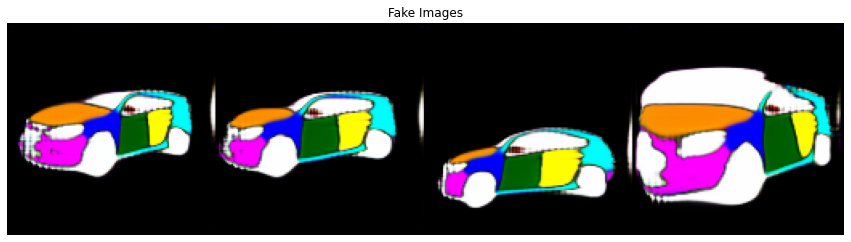

[421/1500][51/52]	Loss_D: 0.0026	Loss_G: 6.8829	D(x): 1.0000	D(G(z)): 0.0025 / 0.0021
[422/1500][51/52]	Loss_D: 0.0112	Loss_G: 6.8894	D(x): 0.9999	D(G(z)): 0.0109 / 0.0074
[423/1500][51/52]	Loss_D: 0.1500	Loss_G: 7.7554	D(x): 0.8666	D(G(z)): 0.0002 / 0.0006
[424/1500][51/52]	Loss_D: 0.0947	Loss_G: 5.9874	D(x): 0.9245	D(G(z)): 0.0067 / 0.0058
[425/1500][51/52]	Loss_D: 0.2902	Loss_G: 8.2501	D(x): 0.9987	D(G(z)): 0.2361 / 0.0003
[426/1500][51/52]	Loss_D: 0.0193	Loss_G: 5.3579	D(x): 0.9977	D(G(z)): 0.0166 / 0.0159
[427/1500][51/52]	Loss_D: 0.0858	Loss_G: 9.0032	D(x): 0.9198	D(G(z)): 0.0009 / 0.0004
[428/1500][51/52]	Loss_D: 0.0101	Loss_G: 5.5844	D(x): 0.9992	D(G(z)): 0.0093 / 0.0060
[429/1500][51/52]	Loss_D: 0.0371	Loss_G: 4.4838	D(x): 0.9890	D(G(z)): 0.0253 / 0.0173
[430/1500][51/52]	Loss_D: 0.0185	Loss_G: 2.9649	D(x): 1.0000	D(G(z)): 0.0182 / 0.0791
[431/1500][51/52]	Loss_D: 0.2444	Loss_G: 10.7489	D(x): 0.8243	D(G(z)): 0.0000 / 0.0000
[432/1500][51/52]	Loss_D: 0.0170	Loss_G: 6.3517	D(x):

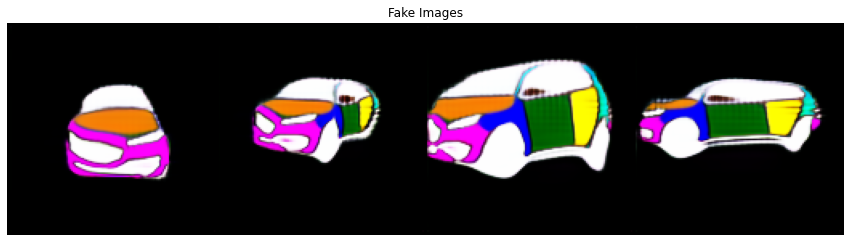

[441/1500][51/52]	Loss_D: 0.0093	Loss_G: 5.7079	D(x): 1.0000	D(G(z)): 0.0092 / 0.0038
[442/1500][51/52]	Loss_D: 0.0024	Loss_G: 7.0050	D(x): 1.0000	D(G(z)): 0.0023 / 0.0018
[443/1500][51/52]	Loss_D: 0.0013	Loss_G: 8.9981	D(x): 1.0000	D(G(z)): 0.0013 / 0.0007
[444/1500][51/52]	Loss_D: 0.0008	Loss_G: 8.9523	D(x): 1.0000	D(G(z)): 0.0008 / 0.0003
[445/1500][51/52]	Loss_D: 0.0022	Loss_G: 7.0983	D(x): 0.9999	D(G(z)): 0.0021 / 0.0014
[446/1500][51/52]	Loss_D: 0.0136	Loss_G: 7.3308	D(x): 0.9996	D(G(z)): 0.0130 / 0.0022
[447/1500][51/52]	Loss_D: 0.0047	Loss_G: 7.2165	D(x): 0.9999	D(G(z)): 0.0046 / 0.0042
[448/1500][51/52]	Loss_D: 0.0259	Loss_G: 9.6146	D(x): 0.9750	D(G(z)): 0.0001 / 0.0001
[449/1500][51/52]	Loss_D: 0.0015	Loss_G: 10.3237	D(x): 0.9988	D(G(z)): 0.0003 / 0.0003
[450/1500][51/52]	Loss_D: 0.6925	Loss_G: 4.6699	D(x): 0.6909	D(G(z)): 0.0006 / 0.0121
[451/1500][51/52]	Loss_D: 0.0220	Loss_G: 6.8415	D(x): 1.0000	D(G(z)): 0.0214 / 0.0258
[452/1500][51/52]	Loss_D: 0.0019	Loss_G: 6.9279	D(x):

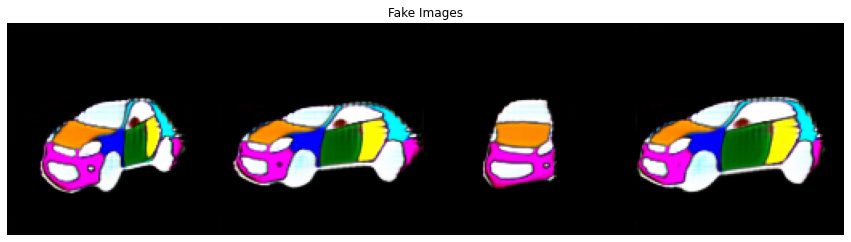

[461/1500][51/52]	Loss_D: 0.0003	Loss_G: 9.6912	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[462/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.5790	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[463/1500][51/52]	Loss_D: 1.5055	Loss_G: 5.3264	D(x): 0.5063	D(G(z)): 0.0003 / 0.0115
[464/1500][51/52]	Loss_D: 0.0787	Loss_G: 5.3456	D(x): 0.9951	D(G(z)): 0.0656 / 0.0095
[465/1500][51/52]	Loss_D: 0.0002	Loss_G: 13.4740	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[466/1500][51/52]	Loss_D: 0.0037	Loss_G: 6.8582	D(x): 1.0000	D(G(z)): 0.0037 / 0.0028
[467/1500][51/52]	Loss_D: 0.0002	Loss_G: 10.8616	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[468/1500][51/52]	Loss_D: 0.0032	Loss_G: 6.6293	D(x): 1.0000	D(G(z)): 0.0032 / 0.0021
[469/1500][51/52]	Loss_D: 0.0087	Loss_G: 6.7874	D(x): 0.9999	D(G(z)): 0.0085 / 0.0033
[470/1500][51/52]	Loss_D: 0.0000	Loss_G: 11.6941	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[471/1500][51/52]	Loss_D: 0.8322	Loss_G: 11.7852	D(x): 0.6369	D(G(z)): 0.0000 / 0.0000
[472/1500][51/52]	Loss_D: 0.0048	Loss_G: 6.4707	D

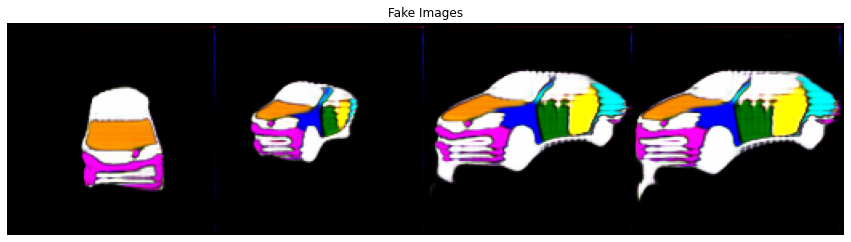

[481/1500][51/52]	Loss_D: 0.0148	Loss_G: 5.7681	D(x): 0.9999	D(G(z)): 0.0144 / 0.0067
[482/1500][51/52]	Loss_D: 0.0116	Loss_G: 6.3340	D(x): 0.9938	D(G(z)): 0.0054 / 0.0040
[483/1500][51/52]	Loss_D: 0.0475	Loss_G: 4.4816	D(x): 0.9996	D(G(z)): 0.0453 / 0.0186
[484/1500][51/52]	Loss_D: 0.0006	Loss_G: 7.7614	D(x): 0.9999	D(G(z)): 0.0005 / 0.0005
[485/1500][51/52]	Loss_D: 0.0054	Loss_G: 11.3461	D(x): 0.9947	D(G(z)): 0.0000 / 0.0000
[486/1500][51/52]	Loss_D: 0.0033	Loss_G: 11.6253	D(x): 0.9967	D(G(z)): 0.0000 / 0.0000
[487/1500][51/52]	Loss_D: 0.0003	Loss_G: 10.6602	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[488/1500][51/52]	Loss_D: 0.0122	Loss_G: 6.2328	D(x): 0.9985	D(G(z)): 0.0105 / 0.0062
[489/1500][51/52]	Loss_D: 0.4740	Loss_G: 0.2973	D(x): 0.6777	D(G(z)): 0.0007 / 0.7750
[490/1500][51/52]	Loss_D: 0.0662	Loss_G: 6.6943	D(x): 0.9997	D(G(z)): 0.0604 / 0.0015
[491/1500][51/52]	Loss_D: 0.0706	Loss_G: 11.1863	D(x): 0.9347	D(G(z)): 0.0017 / 0.0002
[492/1500][51/52]	Loss_D: 0.0188	Loss_G: 7.3237	D(

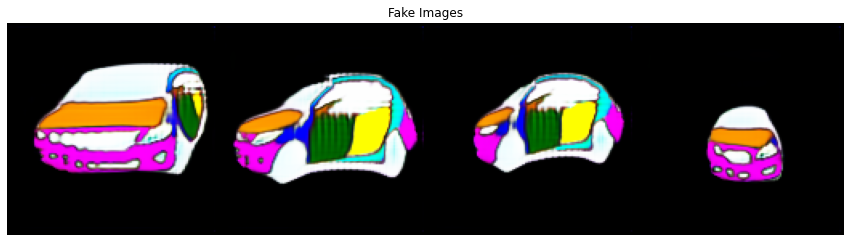

[501/1500][51/52]	Loss_D: 0.0023	Loss_G: 18.3227	D(x): 0.9977	D(G(z)): 0.0000 / 0.0000
[502/1500][51/52]	Loss_D: 0.0118	Loss_G: 7.2175	D(x): 1.0000	D(G(z)): 0.0117 / 0.0023
[503/1500][51/52]	Loss_D: 0.1474	Loss_G: 5.6572	D(x): 0.9959	D(G(z)): 0.1256 / 0.0039
[504/1500][51/52]	Loss_D: 0.0124	Loss_G: 7.1526	D(x): 0.9898	D(G(z)): 0.0021 / 0.0021
[505/1500][51/52]	Loss_D: 0.0682	Loss_G: 6.8999	D(x): 0.9397	D(G(z)): 0.0014 / 0.0026
[506/1500][51/52]	Loss_D: 0.0017	Loss_G: 10.4920	D(x): 0.9985	D(G(z)): 0.0002 / 0.0001
[507/1500][51/52]	Loss_D: 0.0285	Loss_G: 7.7695	D(x): 0.9999	D(G(z)): 0.0271 / 0.0077
[508/1500][51/52]	Loss_D: 0.0041	Loss_G: 9.3820	D(x): 0.9963	D(G(z)): 0.0003 / 0.0003
[509/1500][51/52]	Loss_D: 0.0031	Loss_G: 14.5906	D(x): 0.9969	D(G(z)): 0.0000 / 0.0000
[510/1500][51/52]	Loss_D: 0.0005	Loss_G: 10.5743	D(x): 0.9999	D(G(z)): 0.0004 / 0.0002
[511/1500][51/52]	Loss_D: 0.0053	Loss_G: 15.7226	D(x): 0.9948	D(G(z)): 0.0000 / 0.0000
[512/1500][51/52]	Loss_D: 0.0400	Loss_G: 13.9581	

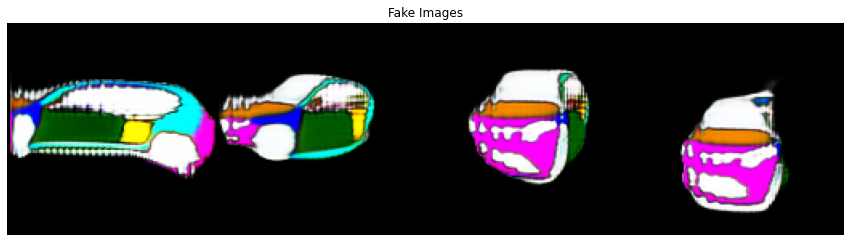

[521/1500][51/52]	Loss_D: 0.0122	Loss_G: 13.2944	D(x): 0.9880	D(G(z)): 0.0000 / 0.0000
[522/1500][51/52]	Loss_D: 1.8757	Loss_G: 1.8711	D(x): 0.2970	D(G(z)): 0.0018 / 0.1856
[523/1500][51/52]	Loss_D: 0.0801	Loss_G: 4.4132	D(x): 0.9890	D(G(z)): 0.0648 / 0.0174
[524/1500][51/52]	Loss_D: 0.0102	Loss_G: 9.3522	D(x): 0.9902	D(G(z)): 0.0003 / 0.0002
[525/1500][51/52]	Loss_D: 0.0909	Loss_G: 4.1003	D(x): 0.9998	D(G(z)): 0.0847 / 0.0211
[526/1500][51/52]	Loss_D: 0.0052	Loss_G: 6.6824	D(x): 0.9968	D(G(z)): 0.0020 / 0.0023
[527/1500][51/52]	Loss_D: 0.0217	Loss_G: 5.4079	D(x): 0.9842	D(G(z)): 0.0056 / 0.0050
[528/1500][51/52]	Loss_D: 0.0524	Loss_G: 5.6972	D(x): 0.9533	D(G(z)): 0.0038 / 0.0040
[529/1500][51/52]	Loss_D: 0.0624	Loss_G: 4.6289	D(x): 0.9988	D(G(z)): 0.0572 / 0.0232
[530/1500][51/52]	Loss_D: 0.2236	Loss_G: 5.4173	D(x): 0.9156	D(G(z)): 0.1039 / 0.0175
[531/1500][51/52]	Loss_D: 0.1814	Loss_G: 5.6047	D(x): 0.9998	D(G(z)): 0.1441 / 0.0040
[532/1500][51/52]	Loss_D: 0.0002	Loss_G: 9.1852	D(x):

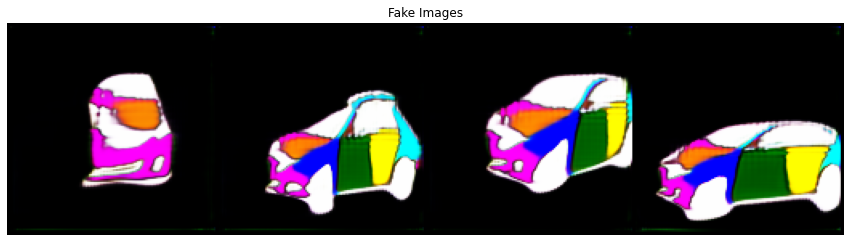

[541/1500][51/52]	Loss_D: 0.0006	Loss_G: 8.3284	D(x): 0.9999	D(G(z)): 0.0006 / 0.0005
[542/1500][51/52]	Loss_D: 0.3250	Loss_G: 8.8403	D(x): 0.9985	D(G(z)): 0.1864 / 0.0004
[543/1500][51/52]	Loss_D: 2.2508	Loss_G: 5.4215	D(x): 0.4709	D(G(z)): 0.0000 / 0.0778
[544/1500][51/52]	Loss_D: 0.0060	Loss_G: 7.0038	D(x): 0.9998	D(G(z)): 0.0057 / 0.0029
[545/1500][51/52]	Loss_D: 0.0155	Loss_G: 5.9104	D(x): 0.9987	D(G(z)): 0.0139 / 0.0087
[546/1500][51/52]	Loss_D: 0.6388	Loss_G: 14.7406	D(x): 0.9979	D(G(z)): 0.3052 / 0.0000
[547/1500][51/52]	Loss_D: 0.0008	Loss_G: 7.6802	D(x): 0.9999	D(G(z)): 0.0007 / 0.0006
[548/1500][51/52]	Loss_D: 0.0319	Loss_G: 5.5017	D(x): 0.9999	D(G(z)): 0.0306 / 0.0071
[549/1500][51/52]	Loss_D: 0.0028	Loss_G: 6.7852	D(x): 0.9999	D(G(z)): 0.0027 / 0.0023
[550/1500][51/52]	Loss_D: 0.0007	Loss_G: 7.3565	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[551/1500][51/52]	Loss_D: 0.0318	Loss_G: 8.1611	D(x): 0.9697	D(G(z)): 0.0008 / 0.0010
[552/1500][51/52]	Loss_D: 0.0121	Loss_G: 11.6540	D(x)

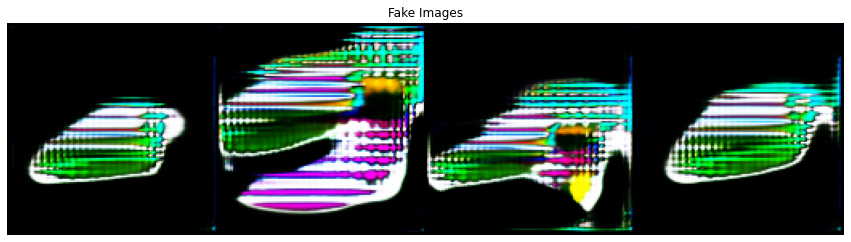

[561/1500][51/52]	Loss_D: 0.0021	Loss_G: 7.1735	D(x): 0.9994	D(G(z)): 0.0015 / 0.0012
[562/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.2477	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[563/1500][51/52]	Loss_D: 0.0000	Loss_G: 11.5524	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[564/1500][51/52]	Loss_D: 0.0012	Loss_G: 8.7976	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[565/1500][51/52]	Loss_D: 0.0024	Loss_G: 11.8641	D(x): 0.9976	D(G(z)): 0.0000 / 0.0000
[566/1500][51/52]	Loss_D: 0.1819	Loss_G: 9.1589	D(x): 0.8686	D(G(z)): 0.0000 / 0.0002
[567/1500][51/52]	Loss_D: 0.0003	Loss_G: 9.1688	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[568/1500][51/52]	Loss_D: 0.0000	Loss_G: 18.8773	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[569/1500][51/52]	Loss_D: 0.2386	Loss_G: 9.4987	D(x): 0.8462	D(G(z)): 0.0002 / 0.0002
[570/1500][51/52]	Loss_D: 0.0061	Loss_G: 5.5938	D(x): 0.9995	D(G(z)): 0.0056 / 0.0040
[571/1500][51/52]	Loss_D: 0.0028	Loss_G: 11.2466	D(x): 0.9973	D(G(z)): 0.0001 / 0.0002
[572/1500][51/52]	Loss_D: 0.0656	Loss_G: 6.6915	D

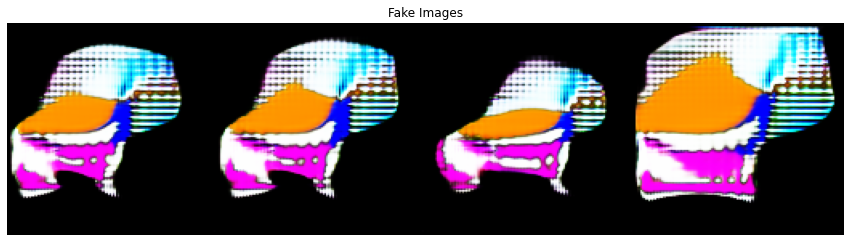

[581/1500][51/52]	Loss_D: 0.0106	Loss_G: 6.2048	D(x): 1.0000	D(G(z)): 0.0105 / 0.0055
[582/1500][51/52]	Loss_D: 0.0049	Loss_G: 7.9090	D(x): 1.0000	D(G(z)): 0.0048 / 0.0028
[583/1500][51/52]	Loss_D: 0.0004	Loss_G: 10.1614	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[584/1500][51/52]	Loss_D: 0.7452	Loss_G: 30.2824	D(x): 1.0000	D(G(z)): 0.4888 / 0.0000
[585/1500][51/52]	Loss_D: 0.0000	Loss_G: 29.2784	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[586/1500][51/52]	Loss_D: 0.0000	Loss_G: 11.7957	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
[587/1500][51/52]	Loss_D: 0.0014	Loss_G: 9.5847	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
[588/1500][51/52]	Loss_D: 0.0004	Loss_G: 10.4690	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[589/1500][51/52]	Loss_D: 0.0000	Loss_G: 17.0423	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[590/1500][51/52]	Loss_D: 0.0000	Loss_G: 17.1504	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[591/1500][51/52]	Loss_D: 0.0005	Loss_G: 11.2144	D(x): 0.9997	D(G(z)): 0.0002 / 0.0000
[592/1500][51/52]	Loss_D: 0.0046	Loss_G: 6.777

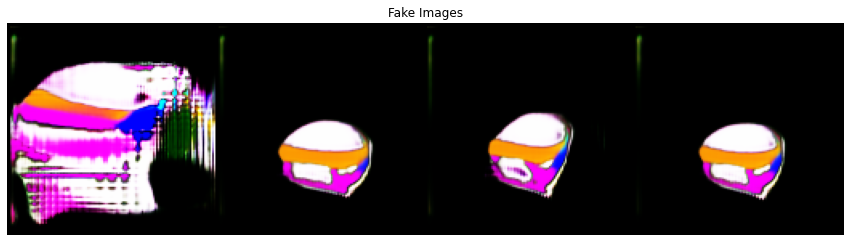

[601/1500][51/52]	Loss_D: 0.0178	Loss_G: 7.8692	D(x): 1.0000	D(G(z)): 0.0172 / 0.0060
[602/1500][51/52]	Loss_D: 0.9545	Loss_G: 0.4946	D(x): 0.5338	D(G(z)): 0.0001 / 0.6441
[603/1500][51/52]	Loss_D: 0.0005	Loss_G: 9.1339	D(x): 0.9997	D(G(z)): 0.0002 / 0.0002
[604/1500][51/52]	Loss_D: 0.0004	Loss_G: 8.0968	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[605/1500][51/52]	Loss_D: 0.0054	Loss_G: 5.7884	D(x): 0.9993	D(G(z)): 0.0047 / 0.0035
[606/1500][51/52]	Loss_D: 0.0033	Loss_G: 8.6698	D(x): 0.9971	D(G(z)): 0.0005 / 0.0005
[607/1500][51/52]	Loss_D: 0.0049	Loss_G: 8.1201	D(x): 0.9962	D(G(z)): 0.0011 / 0.0011
[608/1500][51/52]	Loss_D: 0.0549	Loss_G: 8.3828	D(x): 0.9502	D(G(z)): 0.0003 / 0.0022
[609/1500][51/52]	Loss_D: 0.0117	Loss_G: 14.4345	D(x): 0.9885	D(G(z)): 0.0000 / 0.0000
[610/1500][51/52]	Loss_D: 0.0209	Loss_G: 4.6471	D(x): 0.9998	D(G(z)): 0.0204 / 0.0116
[611/1500][51/52]	Loss_D: 0.0149	Loss_G: 7.3600	D(x): 0.9967	D(G(z)): 0.0114 / 0.0069
[612/1500][51/52]	Loss_D: 0.0074	Loss_G: 6.7685	D(x):

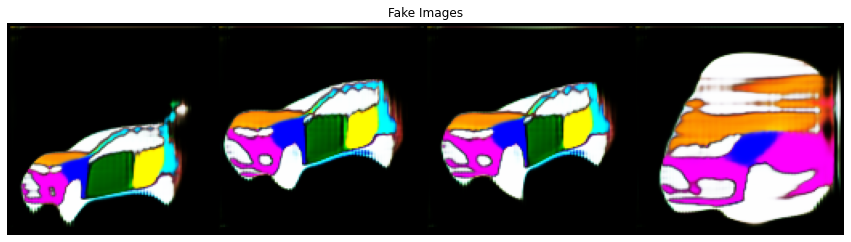

[621/1500][51/52]	Loss_D: 0.0032	Loss_G: 11.8966	D(x): 0.9968	D(G(z)): 0.0000 / 0.0000
[622/1500][51/52]	Loss_D: 0.0042	Loss_G: 7.9420	D(x): 1.0000	D(G(z)): 0.0041 / 0.0026
[623/1500][51/52]	Loss_D: 1.9311	Loss_G: 13.0847	D(x): 1.0000	D(G(z)): 0.6901 / 0.0000
[624/1500][51/52]	Loss_D: 0.0028	Loss_G: 7.0256	D(x): 0.9993	D(G(z)): 0.0021 / 0.0020
[625/1500][51/52]	Loss_D: 0.0000	Loss_G: 11.4398	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[626/1500][51/52]	Loss_D: 0.0205	Loss_G: 4.9298	D(x): 0.9979	D(G(z)): 0.0182 / 0.0087
[627/1500][51/52]	Loss_D: 0.0293	Loss_G: 4.8011	D(x): 0.9904	D(G(z)): 0.0191 / 0.0137
[628/1500][51/52]	Loss_D: 0.0108	Loss_G: 7.5354	D(x): 0.9905	D(G(z)): 0.0011 / 0.0010
[629/1500][51/52]	Loss_D: 0.0029	Loss_G: 6.1636	D(x): 1.0000	D(G(z)): 0.0029 / 0.0024
[630/1500][51/52]	Loss_D: 0.0018	Loss_G: 6.5487	D(x): 0.9999	D(G(z)): 0.0017 / 0.0016
[631/1500][51/52]	Loss_D: 0.0000	Loss_G: 11.7893	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[632/1500][51/52]	Loss_D: 0.0008	Loss_G: 13.9631	D

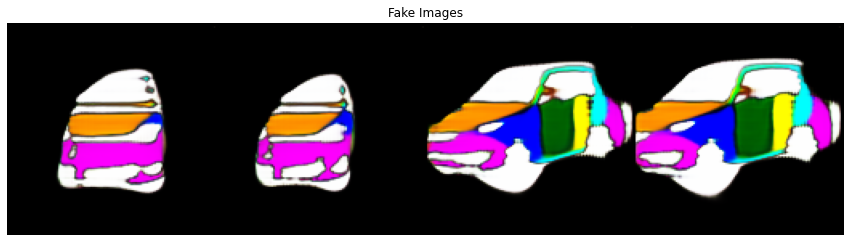

[641/1500][51/52]	Loss_D: 0.0038	Loss_G: 6.8919	D(x): 0.9998	D(G(z)): 0.0036 / 0.0029
[642/1500][51/52]	Loss_D: 0.0042	Loss_G: 13.0534	D(x): 0.9958	D(G(z)): 0.0000 / 0.0000
[643/1500][51/52]	Loss_D: 0.0011	Loss_G: 10.4434	D(x): 0.9989	D(G(z)): 0.0000 / 0.0000
[644/1500][51/52]	Loss_D: 0.0037	Loss_G: 7.9013	D(x): 0.9973	D(G(z)): 0.0010 / 0.0008
[645/1500][51/52]	Loss_D: 0.0307	Loss_G: 4.8838	D(x): 0.9887	D(G(z)): 0.0189 / 0.0097
[646/1500][51/52]	Loss_D: 0.0002	Loss_G: 11.3379	D(x): 0.9999	D(G(z)): 0.0001 / 0.0000
[647/1500][51/52]	Loss_D: 0.0021	Loss_G: 8.2048	D(x): 0.9983	D(G(z)): 0.0004 / 0.0003
[648/1500][51/52]	Loss_D: 0.0358	Loss_G: 4.8215	D(x): 1.0000	D(G(z)): 0.0351 / 0.0085
[649/1500][51/52]	Loss_D: 0.0008	Loss_G: 8.5330	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[650/1500][51/52]	Loss_D: 0.0008	Loss_G: 11.1747	D(x): 0.9995	D(G(z)): 0.0003 / 0.0002
[651/1500][51/52]	Loss_D: 0.0590	Loss_G: 4.5409	D(x): 0.9598	D(G(z)): 0.0163 / 0.0380
[652/1500][51/52]	Loss_D: 0.0049	Loss_G: 6.4374	D(

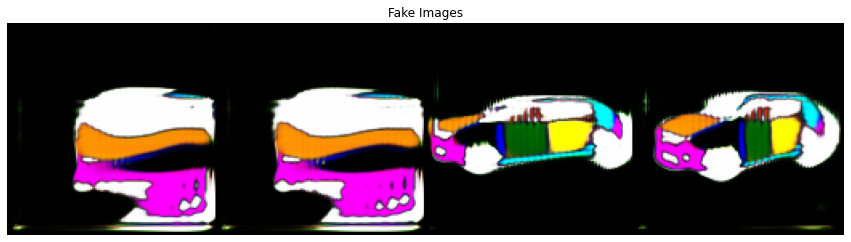

[661/1500][51/52]	Loss_D: 0.0000	Loss_G: 11.8922	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[662/1500][51/52]	Loss_D: 0.0000	Loss_G: 15.2492	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[663/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.5623	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[664/1500][51/52]	Loss_D: 0.0048	Loss_G: 6.1240	D(x): 1.0000	D(G(z)): 0.0048 / 0.0038
[665/1500][51/52]	Loss_D: 0.0445	Loss_G: 4.5585	D(x): 0.9999	D(G(z)): 0.0423 / 0.0168
[666/1500][51/52]	Loss_D: 0.0280	Loss_G: 4.9414	D(x): 0.9834	D(G(z)): 0.0110 / 0.0090
[667/1500][51/52]	Loss_D: 0.0140	Loss_G: 4.4975	D(x): 1.0000	D(G(z)): 0.0138 / 0.0170
[668/1500][51/52]	Loss_D: 0.0783	Loss_G: 8.1156	D(x): 0.9320	D(G(z)): 0.0003 / 0.0005
[669/1500][51/52]	Loss_D: 0.0009	Loss_G: 8.5719	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[670/1500][51/52]	Loss_D: 0.0137	Loss_G: 6.6652	D(x): 0.9999	D(G(z)): 0.0134 / 0.0103
[671/1500][51/52]	Loss_D: 0.0020	Loss_G: 7.3430	D(x): 1.0000	D(G(z)): 0.0020 / 0.0013
[672/1500][51/52]	Loss_D: 0.0111	Loss_G: 13.1309	D(x

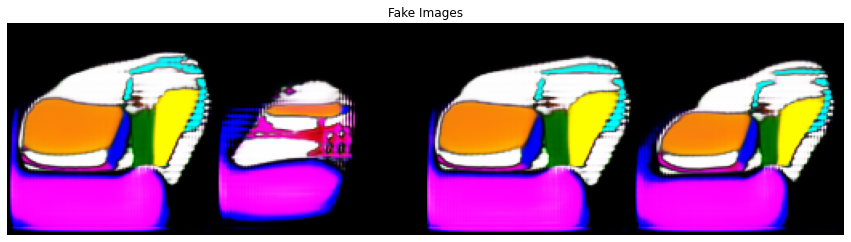

[681/1500][51/52]	Loss_D: 0.0025	Loss_G: 7.0486	D(x): 0.9992	D(G(z)): 0.0017 / 0.0014
[682/1500][51/52]	Loss_D: 0.0031	Loss_G: 7.8544	D(x): 1.0000	D(G(z)): 0.0031 / 0.0010
[683/1500][51/52]	Loss_D: 0.0094	Loss_G: 5.5439	D(x): 0.9998	D(G(z)): 0.0091 / 0.0041
[684/1500][51/52]	Loss_D: 0.0076	Loss_G: 6.6726	D(x): 1.0000	D(G(z)): 0.0076 / 0.0032
[685/1500][51/52]	Loss_D: 0.0002	Loss_G: 10.9415	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[686/1500][51/52]	Loss_D: 0.0002	Loss_G: 10.6008	D(x): 1.0000	D(G(z)): 0.0002 / 0.0000
[687/1500][51/52]	Loss_D: 0.0000	Loss_G: 26.9107	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[688/1500][51/52]	Loss_D: 0.0001	Loss_G: 14.2549	D(x): 0.9999	D(G(z)): 0.0001 / 0.0000
[689/1500][51/52]	Loss_D: 0.0019	Loss_G: 8.0376	D(x): 0.9998	D(G(z)): 0.0017 / 0.0015
[690/1500][51/52]	Loss_D: 1.5184	Loss_G: 28.7674	D(x): 0.4732	D(G(z)): 0.0000 / 0.0000
[691/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.3133	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[692/1500][51/52]	Loss_D: 0.0013	Loss_G: 8.8270	

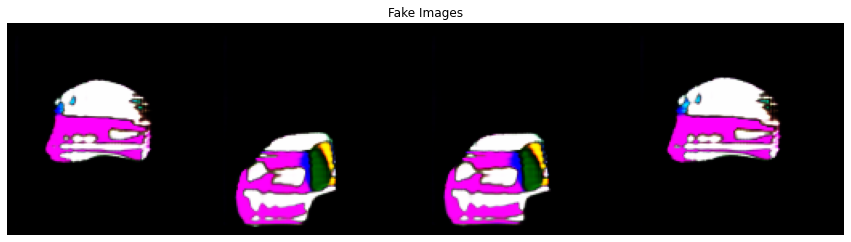

[701/1500][51/52]	Loss_D: 0.0457	Loss_G: 11.1538	D(x): 0.9582	D(G(z)): 0.0000 / 0.0000
[702/1500][51/52]	Loss_D: 0.0002	Loss_G: 10.6412	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[703/1500][51/52]	Loss_D: 0.0024	Loss_G: 13.8655	D(x): 0.9976	D(G(z)): 0.0000 / 0.0000
[704/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.4463	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[705/1500][51/52]	Loss_D: 0.0021	Loss_G: 8.6883	D(x): 0.9981	D(G(z)): 0.0002 / 0.0002
[706/1500][51/52]	Loss_D: 0.0002	Loss_G: 17.8093	D(x): 1.0000	D(G(z)): 0.0002 / 0.0011
[707/1500][51/52]	Loss_D: 0.0395	Loss_G: 6.4069	D(x): 1.0000	D(G(z)): 0.0382 / 0.0031
[708/1500][51/52]	Loss_D: 0.0022	Loss_G: 9.8788	D(x): 0.9978	D(G(z)): 0.0001 / 0.0001
[709/1500][51/52]	Loss_D: 0.0030	Loss_G: 6.6627	D(x): 1.0000	D(G(z)): 0.0030 / 0.0014
[710/1500][51/52]	Loss_D: 0.0068	Loss_G: 6.6090	D(x): 0.9979	D(G(z)): 0.0047 / 0.0027
[711/1500][51/52]	Loss_D: 0.0037	Loss_G: 6.4693	D(x): 0.9983	D(G(z)): 0.0020 / 0.0019
[712/1500][51/52]	Loss_D: 0.0268	Loss_G: 10.5128	

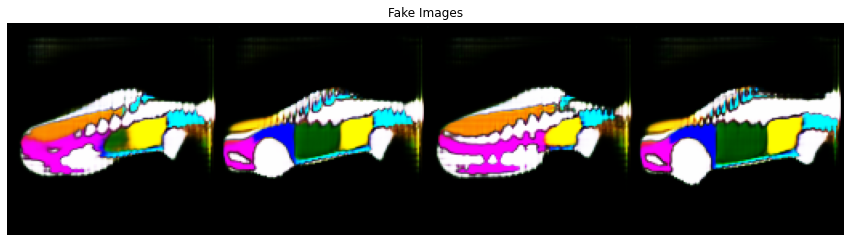

[721/1500][51/52]	Loss_D: 0.0225	Loss_G: 4.5648	D(x): 1.0000	D(G(z)): 0.0221 / 0.0151
[722/1500][51/52]	Loss_D: 0.0008	Loss_G: 7.4174	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[723/1500][51/52]	Loss_D: 0.0145	Loss_G: 6.4132	D(x): 0.9876	D(G(z)): 0.0019 / 0.0017
[724/1500][51/52]	Loss_D: 0.0059	Loss_G: 7.6331	D(x): 1.0000	D(G(z)): 0.0059 / 0.0046
[725/1500][51/52]	Loss_D: 0.0052	Loss_G: 8.2987	D(x): 0.9972	D(G(z)): 0.0024 / 0.0006
[726/1500][51/52]	Loss_D: 0.0029	Loss_G: 7.0399	D(x): 1.0000	D(G(z)): 0.0029 / 0.0017
[727/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.1618	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[728/1500][51/52]	Loss_D: 3.0003	Loss_G: 15.4531	D(x): 0.0801	D(G(z)): 0.0000 / 0.0000
[729/1500][51/52]	Loss_D: 0.0078	Loss_G: 8.3395	D(x): 0.9954	D(G(z)): 0.0031 / 0.0026
[730/1500][51/52]	Loss_D: 0.0479	Loss_G: 5.1413	D(x): 0.9588	D(G(z)): 0.0050 / 0.0067
[731/1500][51/52]	Loss_D: 0.0030	Loss_G: 6.3777	D(x): 1.0000	D(G(z)): 0.0030 / 0.0024
[732/1500][51/52]	Loss_D: 0.0008	Loss_G: 12.7049	D(x

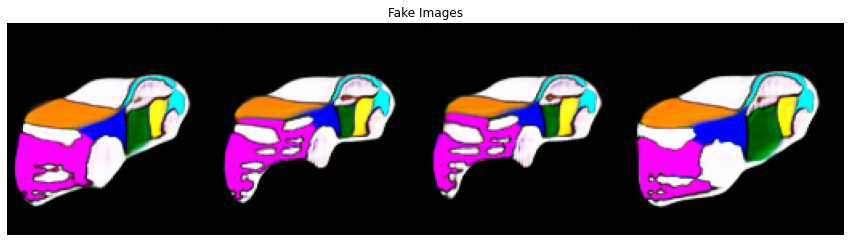

[741/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.0384	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[742/1500][51/52]	Loss_D: 0.0141	Loss_G: 8.6458	D(x): 0.9865	D(G(z)): 0.0005 / 0.0002
[743/1500][51/52]	Loss_D: 0.0016	Loss_G: 7.4077	D(x): 1.0000	D(G(z)): 0.0016 / 0.0009
[744/1500][51/52]	Loss_D: 0.0013	Loss_G: 6.3532	D(x): 1.0000	D(G(z)): 0.0013 / 0.0029
[745/1500][51/52]	Loss_D: 0.2265	Loss_G: 6.1531	D(x): 0.8489	D(G(z)): 0.0003 / 0.0023
[746/1500][51/52]	Loss_D: 0.0014	Loss_G: 6.7489	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[747/1500][51/52]	Loss_D: 0.0003	Loss_G: 8.8652	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[748/1500][51/52]	Loss_D: 0.0025	Loss_G: 6.7011	D(x): 1.0000	D(G(z)): 0.0025 / 0.0020
[749/1500][51/52]	Loss_D: 0.0034	Loss_G: 6.3931	D(x): 0.9999	D(G(z)): 0.0033 / 0.0026
[750/1500][51/52]	Loss_D: 0.0208	Loss_G: 5.2055	D(x): 0.9999	D(G(z)): 0.0202 / 0.0129
[751/1500][51/52]	Loss_D: 0.0003	Loss_G: 8.7734	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[752/1500][51/52]	Loss_D: 0.0171	Loss_G: 15.7884	D(x)

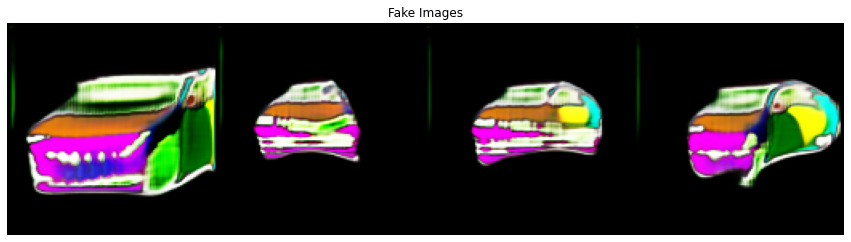

[761/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.9622	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[762/1500][51/52]	Loss_D: 0.0064	Loss_G: 13.3001	D(x): 0.9937	D(G(z)): 0.0000 / 0.0000
[763/1500][51/52]	Loss_D: 0.0045	Loss_G: 6.2421	D(x): 1.0000	D(G(z)): 0.0045 / 0.0032
[764/1500][51/52]	Loss_D: 0.0183	Loss_G: 6.3922	D(x): 0.9855	D(G(z)): 0.0034 / 0.0017
[765/1500][51/52]	Loss_D: 0.0007	Loss_G: 7.7362	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[766/1500][51/52]	Loss_D: 0.0079	Loss_G: 5.8087	D(x): 1.0000	D(G(z)): 0.0079 / 0.0049
[767/1500][51/52]	Loss_D: 0.0049	Loss_G: 7.3412	D(x): 0.9967	D(G(z)): 0.0016 / 0.0015
[768/1500][51/52]	Loss_D: 0.0051	Loss_G: 5.7108	D(x): 0.9998	D(G(z)): 0.0049 / 0.0036
[769/1500][51/52]	Loss_D: 0.0033	Loss_G: 13.4804	D(x): 0.9967	D(G(z)): 0.0000 / 0.0000
[770/1500][51/52]	Loss_D: 0.9125	Loss_G: 13.1991	D(x): 0.9999	D(G(z)): 0.4350 / 0.0001
[771/1500][51/52]	Loss_D: 0.0066	Loss_G: 8.9024	D(x): 0.9939	D(G(z)): 0.0004 / 0.0005
[772/1500][51/52]	Loss_D: 0.0018	Loss_G: 7.6897	D(

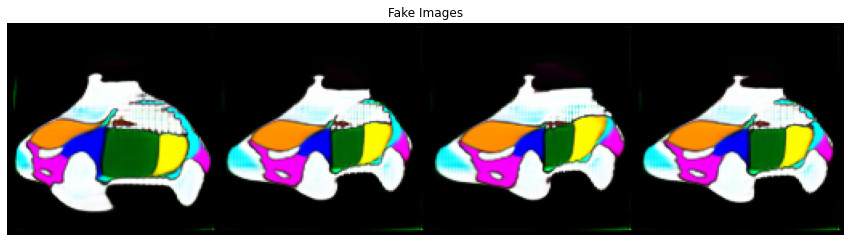

[781/1500][51/52]	Loss_D: 0.0137	Loss_G: 7.6510	D(x): 1.0000	D(G(z)): 0.0134 / 0.0033
[782/1500][51/52]	Loss_D: 0.0000	Loss_G: 16.0581	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[783/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.4439	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[784/1500][51/52]	Loss_D: 0.2246	Loss_G: 2.3421	D(x): 0.8119	D(G(z)): 0.0018 / 0.1303
[785/1500][51/52]	Loss_D: 0.0107	Loss_G: 15.9112	D(x): 0.9897	D(G(z)): 0.0001 / 0.0002
[786/1500][51/52]	Loss_D: 0.0018	Loss_G: 7.0294	D(x): 0.9999	D(G(z)): 0.0018 / 0.0012
[787/1500][51/52]	Loss_D: 0.0012	Loss_G: 9.5968	D(x): 1.0000	D(G(z)): 0.0012 / 0.0009
[788/1500][51/52]	Loss_D: 0.0004	Loss_G: 10.2791	D(x): 0.9998	D(G(z)): 0.0002 / 0.0003
[789/1500][51/52]	Loss_D: 0.0027	Loss_G: 6.2488	D(x): 1.0000	D(G(z)): 0.0027 / 0.0022
[790/1500][51/52]	Loss_D: 0.0001	Loss_G: 12.7127	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[791/1500][51/52]	Loss_D: 0.0711	Loss_G: 6.2065	D(x): 1.0000	D(G(z)): 0.0676 / 0.0023
[792/1500][51/52]	Loss_D: 0.0000	Loss_G: 11.9184	

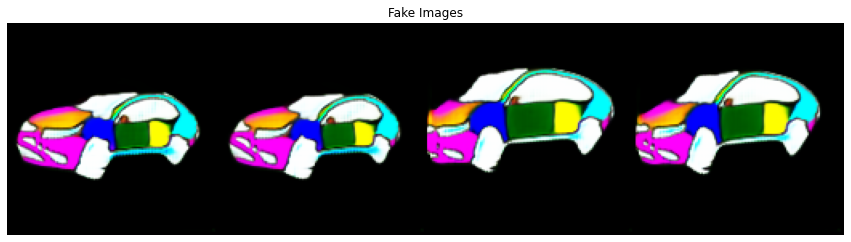

[801/1500][51/52]	Loss_D: 0.0075	Loss_G: 6.2057	D(x): 1.0000	D(G(z)): 0.0075 / 0.0052
[802/1500][51/52]	Loss_D: 0.0006	Loss_G: 7.9041	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
[803/1500][51/52]	Loss_D: 0.0576	Loss_G: 14.8189	D(x): 0.9476	D(G(z)): 0.0000 / 0.0000
[804/1500][51/52]	Loss_D: 0.0000	Loss_G: 12.1659	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[805/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.3116	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[806/1500][51/52]	Loss_D: 0.0000	Loss_G: 10.8933	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[807/1500][51/52]	Loss_D: 0.0585	Loss_G: 4.0783	D(x): 0.9997	D(G(z)): 0.0550 / 0.0363
[808/1500][51/52]	Loss_D: 0.0124	Loss_G: 5.1878	D(x): 1.0000	D(G(z)): 0.0123 / 0.0074
[809/1500][51/52]	Loss_D: 0.0025	Loss_G: 6.9870	D(x): 0.9986	D(G(z)): 0.0011 / 0.0010
[810/1500][51/52]	Loss_D: 0.0006	Loss_G: 7.6621	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[811/1500][51/52]	Loss_D: 0.0012	Loss_G: 6.9770	D(x): 1.0000	D(G(z)): 0.0012 / 0.0011
[812/1500][51/52]	Loss_D: 0.0009	Loss_G: 7.2903	D(

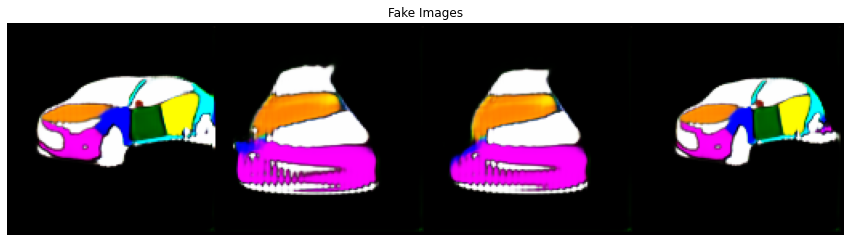

[821/1500][51/52]	Loss_D: 0.0004	Loss_G: 11.0911	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[822/1500][51/52]	Loss_D: 0.0234	Loss_G: 7.0631	D(x): 1.0000	D(G(z)): 0.0231 / 0.0010
[823/1500][51/52]	Loss_D: 0.6430	Loss_G: 10.1923	D(x): 1.0000	D(G(z)): 0.4535 / 0.0000
[824/1500][51/52]	Loss_D: 0.0007	Loss_G: 10.4549	D(x): 0.9994	D(G(z)): 0.0001 / 0.0001
[825/1500][51/52]	Loss_D: 0.0000	Loss_G: 13.8511	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[826/1500][51/52]	Loss_D: 0.2691	Loss_G: 1.6345	D(x): 0.7967	D(G(z)): 0.0045 / 0.2562
[827/1500][51/52]	Loss_D: 0.0278	Loss_G: 6.0089	D(x): 0.9827	D(G(z)): 0.0099 / 0.0083
[828/1500][51/52]	Loss_D: 0.0329	Loss_G: 4.6003	D(x): 0.9982	D(G(z)): 0.0303 / 0.0140
[829/1500][51/52]	Loss_D: 0.0006	Loss_G: 9.2441	D(x): 1.0000	D(G(z)): 0.0006 / 0.0002
[830/1500][51/52]	Loss_D: 0.1248	Loss_G: 7.0866	D(x): 1.0000	D(G(z)): 0.1089 / 0.0018
[831/1500][51/52]	Loss_D: 0.0021	Loss_G: 6.3170	D(x): 1.0000	D(G(z)): 0.0021 / 0.0019
[832/1500][51/52]	Loss_D: 0.0007	Loss_G: 8.6139	D(

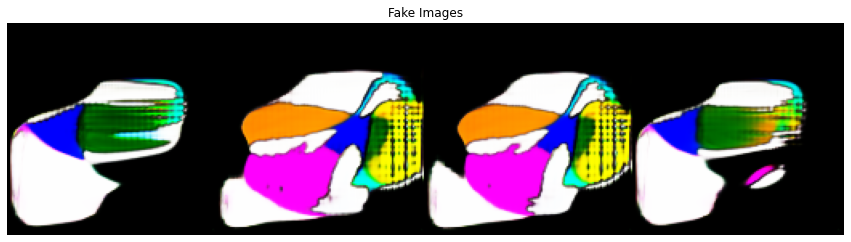

[841/1500][51/52]	Loss_D: 0.0212	Loss_G: 6.9805	D(x): 0.9910	D(G(z)): 0.0120 / 0.0019
[842/1500][51/52]	Loss_D: 0.0003	Loss_G: 12.0185	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[843/1500][51/52]	Loss_D: 0.0000	Loss_G: 10.2934	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[844/1500][51/52]	Loss_D: 0.0006	Loss_G: 7.7418	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[845/1500][51/52]	Loss_D: 0.0006	Loss_G: 9.8208	D(x): 0.9997	D(G(z)): 0.0003 / 0.0002
[846/1500][51/52]	Loss_D: 0.2411	Loss_G: 4.3972	D(x): 0.8435	D(G(z)): 0.0002 / 0.0216
[847/1500][51/52]	Loss_D: 0.0190	Loss_G: 9.3826	D(x): 0.9977	D(G(z)): 0.0165 / 0.0039
[848/1500][51/52]	Loss_D: 0.0105	Loss_G: 7.8778	D(x): 1.0000	D(G(z)): 0.0103 / 0.0062
[849/1500][51/52]	Loss_D: 0.0006	Loss_G: 10.4571	D(x): 0.9996	D(G(z)): 0.0003 / 0.0002
[850/1500][51/52]	Loss_D: 0.0010	Loss_G: 7.6105	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[851/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.6965	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[852/1500][51/52]	Loss_D: 0.0031	Loss_G: 6.8825	D(x

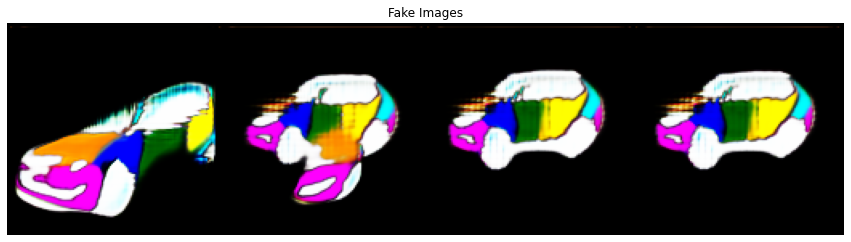

[861/1500][51/52]	Loss_D: 0.0004	Loss_G: 8.1700	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[862/1500][51/52]	Loss_D: 0.0002	Loss_G: 10.2636	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[863/1500][51/52]	Loss_D: 0.0024	Loss_G: 7.5328	D(x): 0.9995	D(G(z)): 0.0019 / 0.0006
[864/1500][51/52]	Loss_D: 0.0350	Loss_G: 11.1079	D(x): 0.9674	D(G(z)): 0.0000 / 0.0000
[865/1500][51/52]	Loss_D: 0.0204	Loss_G: 13.8072	D(x): 0.9803	D(G(z)): 0.0000 / 0.0000
[866/1500][51/52]	Loss_D: 0.0020	Loss_G: 11.5790	D(x): 0.9980	D(G(z)): 0.0000 / 0.0000
[867/1500][51/52]	Loss_D: 0.0008	Loss_G: 8.2966	D(x): 1.0000	D(G(z)): 0.0008 / 0.0006
[868/1500][51/52]	Loss_D: 0.0002	Loss_G: 12.8727	D(x): 1.0000	D(G(z)): 0.0001 / 0.0002
[869/1500][51/52]	Loss_D: 0.0000	Loss_G: 11.5512	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[870/1500][51/52]	Loss_D: 0.0162	Loss_G: 5.9093	D(x): 0.9999	D(G(z)): 0.0160 / 0.0032
[871/1500][51/52]	Loss_D: 0.0003	Loss_G: 14.4678	D(x): 0.9997	D(G(z)): 0.0000 / 0.0000
[872/1500][51/52]	Loss_D: 0.0070	Loss_G: 5.5855

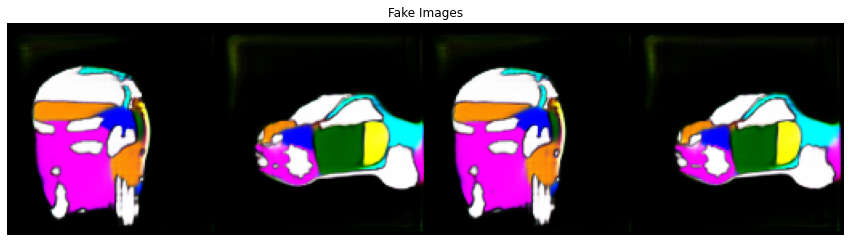

[881/1500][51/52]	Loss_D: 0.0114	Loss_G: 5.5683	D(x): 0.9999	D(G(z)): 0.0112 / 0.0053
[882/1500][51/52]	Loss_D: 0.0011	Loss_G: 7.6478	D(x): 1.0000	D(G(z)): 0.0011 / 0.0007
[883/1500][51/52]	Loss_D: 0.0168	Loss_G: 3.3497	D(x): 1.0000	D(G(z)): 0.0167 / 0.0534
[884/1500][51/52]	Loss_D: 0.0350	Loss_G: 8.3321	D(x): 0.9679	D(G(z)): 0.0006 / 0.0006
[885/1500][51/52]	Loss_D: 0.0007	Loss_G: 9.2257	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[886/1500][51/52]	Loss_D: 0.0132	Loss_G: 5.4236	D(x): 1.0000	D(G(z)): 0.0130 / 0.0072
[887/1500][51/52]	Loss_D: 0.0006	Loss_G: 14.2285	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[888/1500][51/52]	Loss_D: 0.0000	Loss_G: 14.2181	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[889/1500][51/52]	Loss_D: 0.0034	Loss_G: 8.7804	D(x): 0.9973	D(G(z)): 0.0007 / 0.0009
[890/1500][51/52]	Loss_D: 0.0005	Loss_G: 8.8039	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[891/1500][51/52]	Loss_D: 0.0008	Loss_G: 8.1749	D(x): 0.9995	D(G(z)): 0.0004 / 0.0003
[892/1500][51/52]	Loss_D: 0.0066	Loss_G: 6.3692	D(x)

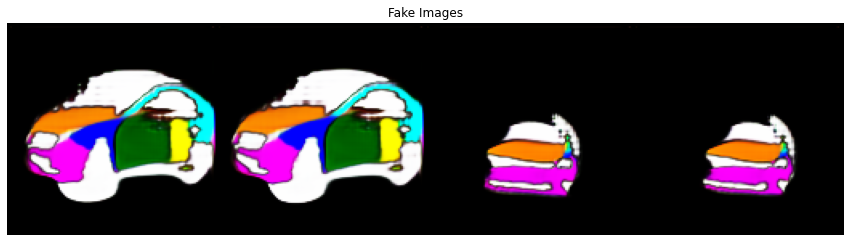

[901/1500][51/52]	Loss_D: 0.0251	Loss_G: 4.5394	D(x): 1.0000	D(G(z)): 0.0247 / 0.0109
[902/1500][51/52]	Loss_D: 0.0015	Loss_G: 6.8506	D(x): 0.9998	D(G(z)): 0.0013 / 0.0011
[903/1500][51/52]	Loss_D: 0.3395	Loss_G: 5.4568	D(x): 0.8064	D(G(z)): 0.0003 / 0.0124
[904/1500][51/52]	Loss_D: 0.0044	Loss_G: 6.2057	D(x): 0.9995	D(G(z)): 0.0038 / 0.0036
[905/1500][51/52]	Loss_D: 0.0012	Loss_G: 8.6233	D(x): 0.9992	D(G(z)): 0.0004 / 0.0004
[906/1500][51/52]	Loss_D: 0.1887	Loss_G: 8.2284	D(x): 1.0000	D(G(z)): 0.1565 / 0.0011
[907/1500][51/52]	Loss_D: 0.0120	Loss_G: 6.1238	D(x): 1.0000	D(G(z)): 0.0118 / 0.1728
[908/1500][51/52]	Loss_D: 0.0044	Loss_G: 6.0861	D(x): 1.0000	D(G(z)): 0.0044 / 0.0031
[909/1500][51/52]	Loss_D: 0.0079	Loss_G: 5.2418	D(x): 0.9999	D(G(z)): 0.0077 / 0.0065
[910/1500][51/52]	Loss_D: 0.0336	Loss_G: 6.3641	D(x): 1.0000	D(G(z)): 0.0316 / 0.0039
[911/1500][51/52]	Loss_D: 0.0007	Loss_G: 7.2866	D(x): 1.0000	D(G(z)): 0.0007 / 0.0008
[912/1500][51/52]	Loss_D: 0.0063	Loss_G: 5.3196	D(x): 

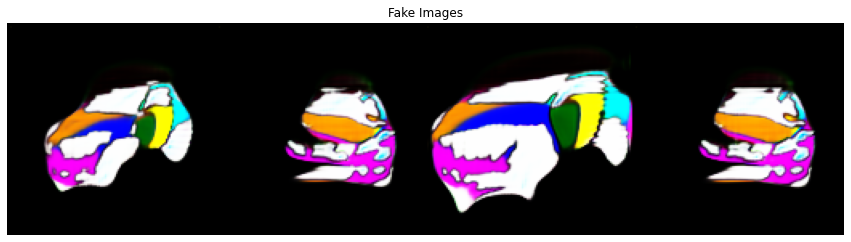

[921/1500][51/52]	Loss_D: 0.0000	Loss_G: 12.5070	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[922/1500][51/52]	Loss_D: 0.0354	Loss_G: 4.8433	D(x): 1.0000	D(G(z)): 0.0347 / 0.0083
[923/1500][51/52]	Loss_D: 0.0040	Loss_G: 5.7642	D(x): 1.0000	D(G(z)): 0.0040 / 0.0033
[924/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.0101	D(x): 1.0000	D(G(z)): 0.0001 / 0.0002
[925/1500][51/52]	Loss_D: 0.9600	Loss_G: 1.6790	D(x): 0.5834	D(G(z)): 0.0018 / 0.2611
[926/1500][51/52]	Loss_D: 0.0148	Loss_G: 5.1080	D(x): 1.0000	D(G(z)): 0.0147 / 0.0088
[927/1500][51/52]	Loss_D: 0.0009	Loss_G: 7.3202	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[928/1500][51/52]	Loss_D: 0.0000	Loss_G: 18.1082	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[929/1500][51/52]	Loss_D: 0.0004	Loss_G: 9.3272	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[930/1500][51/52]	Loss_D: 0.0003	Loss_G: 8.8003	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[931/1500][51/52]	Loss_D: 0.4067	Loss_G: 6.1898	D(x): 0.7391	D(G(z)): 0.0003 / 0.0056
[932/1500][51/52]	Loss_D: 0.0270	Loss_G: 10.4727	D(

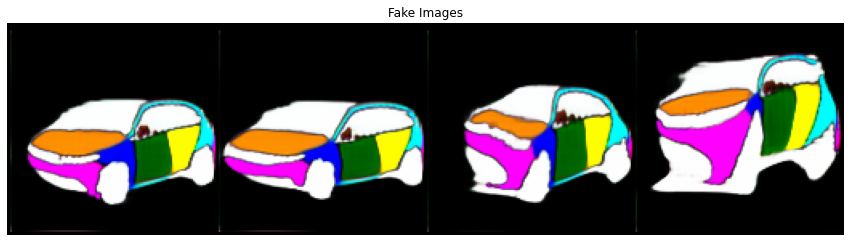

[941/1500][51/52]	Loss_D: 0.0003	Loss_G: 11.0740	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[942/1500][51/52]	Loss_D: 0.0000	Loss_G: 13.9368	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[943/1500][51/52]	Loss_D: 0.0033	Loss_G: 7.4394	D(x): 1.0000	D(G(z)): 0.0033 / 0.0025
[944/1500][51/52]	Loss_D: 0.0003	Loss_G: 13.9592	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[945/1500][51/52]	Loss_D: 0.0091	Loss_G: 4.2665	D(x): 1.0000	D(G(z)): 0.0091 / 0.0206
[946/1500][51/52]	Loss_D: 0.0015	Loss_G: 7.2929	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[947/1500][51/52]	Loss_D: 0.0010	Loss_G: 7.2276	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[948/1500][51/52]	Loss_D: 0.0011	Loss_G: 7.0343	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[949/1500][51/52]	Loss_D: 0.0005	Loss_G: 8.0603	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[950/1500][51/52]	Loss_D: 0.0045	Loss_G: 6.0563	D(x): 1.0000	D(G(z)): 0.0045 / 0.0030
[951/1500][51/52]	Loss_D: 0.0021	Loss_G: 7.5613	D(x): 0.9992	D(G(z)): 0.0013 / 0.0006
[952/1500][51/52]	Loss_D: 0.0000	Loss_G: 20.2211	D(

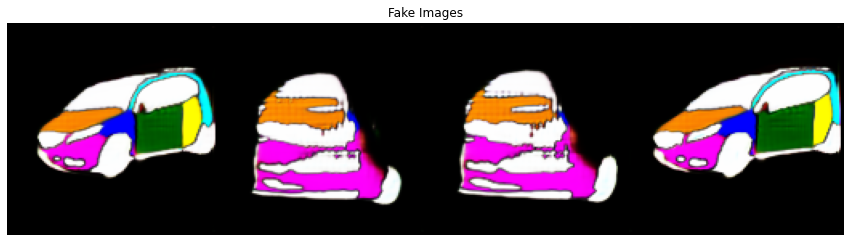

[961/1500][51/52]	Loss_D: 0.0011	Loss_G: 7.1981	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[962/1500][51/52]	Loss_D: 0.0000	Loss_G: 17.9999	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[963/1500][51/52]	Loss_D: 0.1939	Loss_G: 4.5545	D(x): 0.8577	D(G(z)): 0.0067 / 0.0109
[964/1500][51/52]	Loss_D: 0.0030	Loss_G: 6.0989	D(x): 1.0000	D(G(z)): 0.0030 / 0.0026
[965/1500][51/52]	Loss_D: 1.1369	Loss_G: 6.1861	D(x): 1.0000	D(G(z)): 0.4957 / 0.0029
[966/1500][51/52]	Loss_D: 0.0300	Loss_G: 2.9978	D(x): 1.0000	D(G(z)): 0.0295 / 0.0502
[967/1500][51/52]	Loss_D: 0.0176	Loss_G: 5.4077	D(x): 1.0000	D(G(z)): 0.0174 / 0.0049
[968/1500][51/52]	Loss_D: 0.0263	Loss_G: 4.8168	D(x): 0.9978	D(G(z)): 0.0237 / 0.0129
[969/1500][51/52]	Loss_D: 0.0005	Loss_G: 8.0635	D(x): 1.0000	D(G(z)): 0.0005 / 0.0006
[970/1500][51/52]	Loss_D: 0.0045	Loss_G: 6.2776	D(x): 0.9997	D(G(z)): 0.0042 / 0.0028
[971/1500][51/52]	Loss_D: 0.0023	Loss_G: 6.5830	D(x): 0.9998	D(G(z)): 0.0020 / 0.0016
[972/1500][51/52]	Loss_D: 0.0223	Loss_G: 4.8253	D(x):

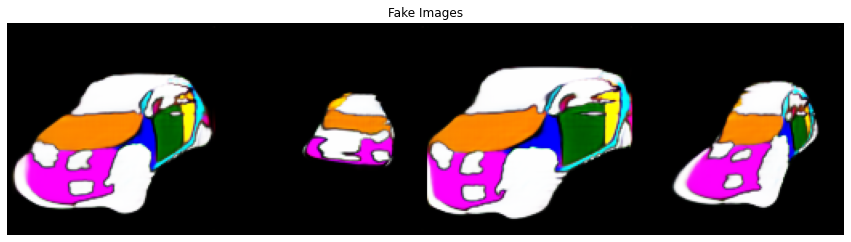

[981/1500][51/52]	Loss_D: 0.0005	Loss_G: 8.7887	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[982/1500][51/52]	Loss_D: 0.0068	Loss_G: 5.5317	D(x): 1.0000	D(G(z)): 0.0067 / 0.0048
[983/1500][51/52]	Loss_D: 0.0085	Loss_G: 6.1817	D(x): 1.0000	D(G(z)): 0.0083 / 0.0042
[984/1500][51/52]	Loss_D: 0.0000	Loss_G: 12.7590	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[985/1500][51/52]	Loss_D: 0.0072	Loss_G: 6.0948	D(x): 0.9963	D(G(z)): 0.0034 / 0.0028
[986/1500][51/52]	Loss_D: 0.0429	Loss_G: 5.8311	D(x): 0.9626	D(G(z)): 0.0032 / 0.0037
[987/1500][51/52]	Loss_D: 0.0014	Loss_G: 8.5762	D(x): 0.9999	D(G(z)): 0.0013 / 0.0011
[988/1500][51/52]	Loss_D: 0.0429	Loss_G: 13.9363	D(x): 0.9580	D(G(z)): 0.0000 / 0.0000
[989/1500][51/52]	Loss_D: 0.0063	Loss_G: 7.6866	D(x): 0.9991	D(G(z)): 0.0054 / 0.0005
[990/1500][51/52]	Loss_D: 0.0011	Loss_G: 15.5796	D(x): 0.9989	D(G(z)): 0.0000 / 0.0000
[991/1500][51/52]	Loss_D: 0.1684	Loss_G: 7.4915	D(x): 0.9991	D(G(z)): 0.1423 / 0.0006
[992/1500][51/52]	Loss_D: 0.0016	Loss_G: 6.7287	D(x

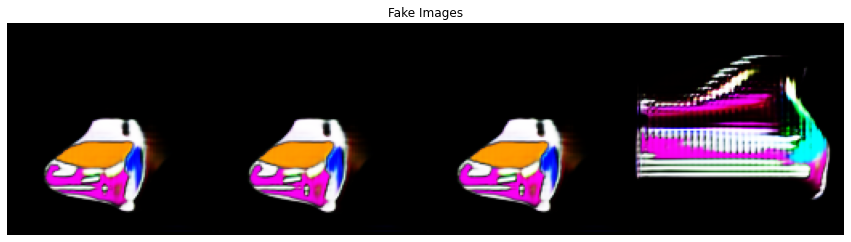

[1001/1500][51/52]	Loss_D: 0.1403	Loss_G: 11.1693	D(x): 0.8840	D(G(z)): 0.0000 / 0.0000
[1002/1500][51/52]	Loss_D: 0.0003	Loss_G: 9.4134	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[1003/1500][51/52]	Loss_D: 0.0000	Loss_G: 13.9770	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1004/1500][51/52]	Loss_D: 0.0004	Loss_G: 8.2648	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[1005/1500][51/52]	Loss_D: 0.0002	Loss_G: 9.3538	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[1006/1500][51/52]	Loss_D: 0.0003	Loss_G: 12.2727	D(x): 0.9997	D(G(z)): 0.0000 / 0.0000
[1007/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.0595	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1008/1500][51/52]	Loss_D: 0.0024	Loss_G: 6.9134	D(x): 0.9989	D(G(z)): 0.0012 / 0.0011
[1009/1500][51/52]	Loss_D: 0.7234	Loss_G: 1.7305	D(x): 0.6311	D(G(z)): 0.0014 / 0.1811
[1010/1500][51/52]	Loss_D: 0.0025	Loss_G: 6.6908	D(x): 0.9997	D(G(z)): 0.0023 / 0.0017
[1011/1500][51/52]	Loss_D: 0.0010	Loss_G: 7.5798	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[1012/1500][51/52]	Loss_D: 0.0001	Loss_

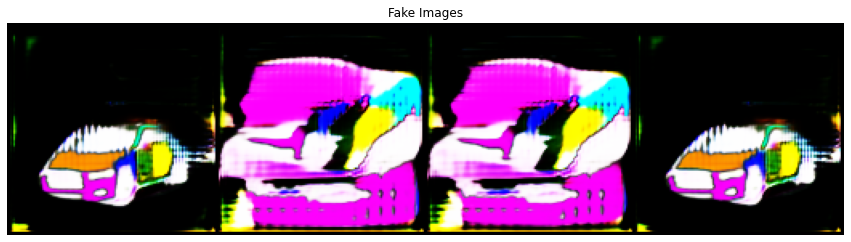

[1021/1500][51/52]	Loss_D: 0.0007	Loss_G: 17.5514	D(x): 0.9996	D(G(z)): 0.0003 / 0.0000
[1022/1500][51/52]	Loss_D: 0.0014	Loss_G: 19.6467	D(x): 0.9986	D(G(z)): 0.0000 / 0.0000
[1023/1500][51/52]	Loss_D: 0.0110	Loss_G: 10.1812	D(x): 1.0000	D(G(z)): 0.0108 / 0.0030
[1024/1500][51/52]	Loss_D: 0.0116	Loss_G: 32.0466	D(x): 0.9885	D(G(z)): 0.0000 / 0.0000
[1025/1500][51/52]	Loss_D: 0.0001	Loss_G: 15.3386	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[1026/1500][51/52]	Loss_D: 0.0003	Loss_G: 11.0846	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[1027/1500][51/52]	Loss_D: 0.0005	Loss_G: 8.1910	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[1028/1500][51/52]	Loss_D: 0.0000	Loss_G: 15.4510	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1029/1500][51/52]	Loss_D: 0.0010	Loss_G: 8.2983	D(x): 0.9999	D(G(z)): 0.0008 / 0.0006
[1030/1500][51/52]	Loss_D: 0.0011	Loss_G: 7.1328	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[1031/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.3409	D(x): 0.9999	D(G(z)): 0.0000 / 0.0001
[1032/1500][51/52]	Loss_D: 0.0035	Lo

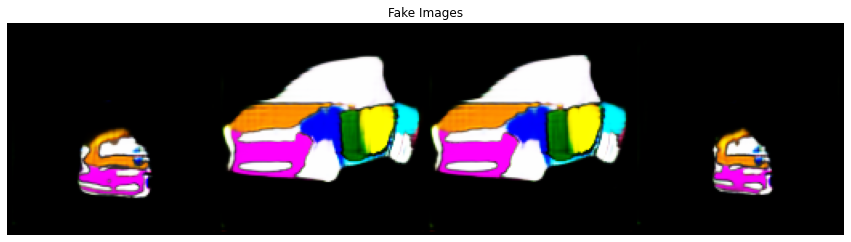

[1041/1500][51/52]	Loss_D: 0.0000	Loss_G: 12.9615	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1042/1500][51/52]	Loss_D: 0.0052	Loss_G: 5.8455	D(x): 1.0000	D(G(z)): 0.0052 / 0.0031
[1043/1500][51/52]	Loss_D: 0.0078	Loss_G: 6.1978	D(x): 1.0000	D(G(z)): 0.0077 / 0.0029
[1044/1500][51/52]	Loss_D: 0.0000	Loss_G: 14.2435	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1045/1500][51/52]	Loss_D: 0.0065	Loss_G: 7.0493	D(x): 0.9945	D(G(z)): 0.0010 / 0.0009
[1046/1500][51/52]	Loss_D: 0.5764	Loss_G: 11.4704	D(x): 1.0000	D(G(z)): 0.3747 / 0.0001
[1047/1500][51/52]	Loss_D: 0.3290	Loss_G: 1.8645	D(x): 0.8177	D(G(z)): 0.0240 / 0.2421
[1048/1500][51/52]	Loss_D: 0.0215	Loss_G: 3.2971	D(x): 0.9999	D(G(z)): 0.0210 / 0.0543
[1049/1500][51/52]	Loss_D: 0.0003	Loss_G: 12.7395	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[1050/1500][51/52]	Loss_D: 0.5005	Loss_G: 10.0758	D(x): 0.7432	D(G(z)): 0.0001 / 0.0279
[1051/1500][51/52]	Loss_D: 0.0085	Loss_G: 6.6410	D(x): 1.0000	D(G(z)): 0.0085 / 0.0032
[1052/1500][51/52]	Loss_D: 0.0003	Loss

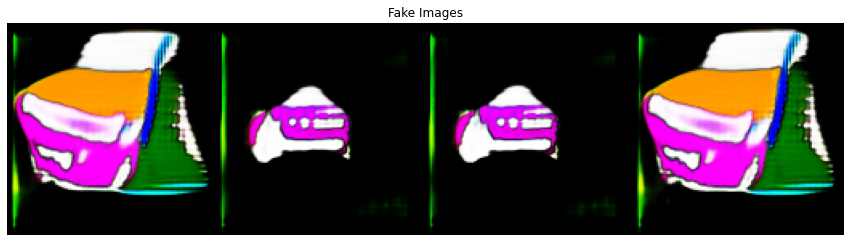

[1061/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.6662	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1062/1500][51/52]	Loss_D: 0.0012	Loss_G: 7.0882	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[1063/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.1131	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1064/1500][51/52]	Loss_D: 0.0000	Loss_G: 13.2530	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1065/1500][51/52]	Loss_D: 0.0002	Loss_G: 8.7953	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[1066/1500][51/52]	Loss_D: 0.0000	Loss_G: 12.7824	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1067/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.5649	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1068/1500][51/52]	Loss_D: 0.0005	Loss_G: 7.8609	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[1069/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.1801	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1070/1500][51/52]	Loss_D: 0.0000	Loss_G: 15.9789	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1071/1500][51/52]	Loss_D: 0.0002	Loss_G: 9.9463	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[1072/1500][51/52]	Loss_D: 0.0001	Loss

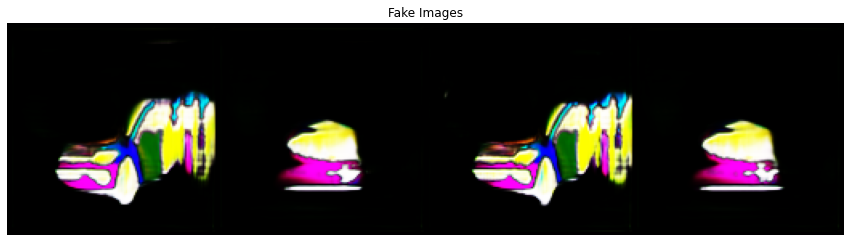

[1081/1500][51/52]	Loss_D: 0.0006	Loss_G: 7.9207	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
[1082/1500][51/52]	Loss_D: 0.0001	Loss_G: 46.2359	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[1083/1500][51/52]	Loss_D: 0.0000	Loss_G: 44.5453	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1084/1500][51/52]	Loss_D: 0.0003	Loss_G: 28.8914	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[1085/1500][51/52]	Loss_D: 0.0000	Loss_G: 24.9615	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1086/1500][51/52]	Loss_D: 0.0005	Loss_G: 8.1752	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[1087/1500][51/52]	Loss_D: 0.1801	Loss_G: 50.5179	D(x): 0.8559	D(G(z)): 0.0000 / 0.0000
[1088/1500][51/52]	Loss_D: 0.0173	Loss_G: 33.7201	D(x): 1.0000	D(G(z)): 0.0170 / 0.0011
[1089/1500][51/52]	Loss_D: 0.0000	Loss_G: 45.3059	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1090/1500][51/52]	Loss_D: 0.0083	Loss_G: 26.0369	D(x): 0.9918	D(G(z)): 0.0000 / 0.0000
[1091/1500][51/52]	Loss_D: 0.0004	Loss_G: 8.9159	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[1092/1500][51/52]	Loss_D: 0.0042	L

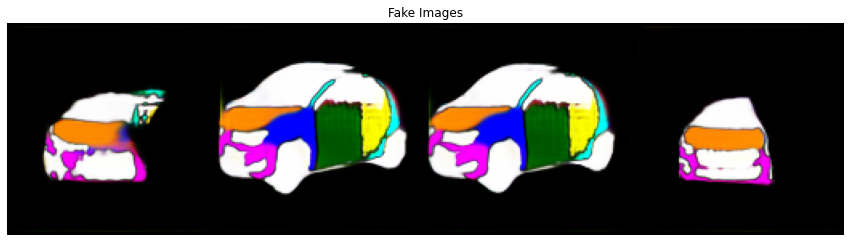

[1101/1500][51/52]	Loss_D: 0.0094	Loss_G: 6.2162	D(x): 0.9930	D(G(z)): 0.0023 / 0.0023
[1102/1500][51/52]	Loss_D: 0.0032	Loss_G: 7.0490	D(x): 1.0000	D(G(z)): 0.0032 / 0.0025
[1103/1500][51/52]	Loss_D: 0.0000	Loss_G: 13.7572	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1104/1500][51/52]	Loss_D: 0.0028	Loss_G: 6.6141	D(x): 1.0000	D(G(z)): 0.0028 / 0.0022
[1105/1500][51/52]	Loss_D: 0.0002	Loss_G: 10.8116	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[1106/1500][51/52]	Loss_D: 0.0005	Loss_G: 11.2334	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[1107/1500][51/52]	Loss_D: 0.0104	Loss_G: 5.8592	D(x): 1.0000	D(G(z)): 0.0104 / 0.0046
[1108/1500][51/52]	Loss_D: 0.0369	Loss_G: 3.7159	D(x): 1.0000	D(G(z)): 0.0361 / 0.0261
[1109/1500][51/52]	Loss_D: 0.0014	Loss_G: 6.6839	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[1110/1500][51/52]	Loss_D: 0.0132	Loss_G: 5.1439	D(x): 0.9942	D(G(z)): 0.0074 / 0.0059
[1111/1500][51/52]	Loss_D: 0.0021	Loss_G: 6.9841	D(x): 0.9998	D(G(z)): 0.0020 / 0.0014
[1112/1500][51/52]	Loss_D: 0.0038	Loss_G

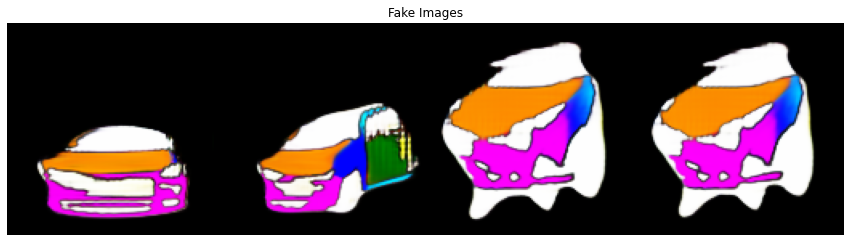

[1121/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.8177	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1122/1500][51/52]	Loss_D: 0.0148	Loss_G: 4.7181	D(x): 1.0000	D(G(z)): 0.0146 / 0.0110
[1123/1500][51/52]	Loss_D: 0.0000	Loss_G: 21.5580	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1124/1500][51/52]	Loss_D: 0.0002	Loss_G: 10.2843	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[1125/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.5990	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1126/1500][51/52]	Loss_D: 0.0000	Loss_G: 11.2849	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1127/1500][51/52]	Loss_D: 0.0083	Loss_G: 6.7855	D(x): 0.9967	D(G(z)): 0.0049 / 0.0024
[1128/1500][51/52]	Loss_D: 0.0009	Loss_G: 7.6329	D(x): 1.0000	D(G(z)): 0.0009 / 0.0018
[1129/1500][51/52]	Loss_D: 0.0012	Loss_G: 7.3430	D(x): 1.0000	D(G(z)): 0.0012 / 0.0020
[1130/1500][51/52]	Loss_D: 0.0014	Loss_G: 11.1730	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
[1131/1500][51/52]	Loss_D: 0.1343	Loss_G: 10.5754	D(x): 0.8853	D(G(z)): 0.0000 / 0.0000
[1132/1500][51/52]	Loss_D: 0.0100	Loss

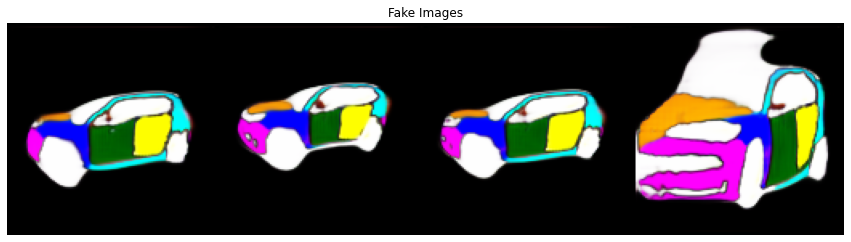

[1141/1500][51/52]	Loss_D: 0.0006	Loss_G: 7.1179	D(x): 1.0000	D(G(z)): 0.0006 / 0.0014
[1142/1500][51/52]	Loss_D: 0.0035	Loss_G: 7.4037	D(x): 1.0000	D(G(z)): 0.0035 / 0.0027
[1143/1500][51/52]	Loss_D: 0.1874	Loss_G: 5.6496	D(x): 0.8358	D(G(z)): 0.0005 / 0.0047
[1144/1500][51/52]	Loss_D: 0.0019	Loss_G: 6.3332	D(x): 1.0000	D(G(z)): 0.0019 / 0.0027
[1145/1500][51/52]	Loss_D: 0.0074	Loss_G: 6.4011	D(x): 0.9999	D(G(z)): 0.0073 / 0.0029
[1146/1500][51/52]	Loss_D: 0.0009	Loss_G: 13.7269	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[1147/1500][51/52]	Loss_D: 0.0071	Loss_G: 6.5947	D(x): 0.9999	D(G(z)): 0.0070 / 0.0047
[1148/1500][51/52]	Loss_D: 0.0203	Loss_G: 6.0507	D(x): 0.9837	D(G(z)): 0.0035 / 0.0032
[1149/1500][51/52]	Loss_D: 0.0040	Loss_G: 7.5336	D(x): 1.0000	D(G(z)): 0.0040 / 0.0034
[1150/1500][51/52]	Loss_D: 0.0061	Loss_G: 5.7379	D(x): 1.0000	D(G(z)): 0.0061 / 0.0038
[1151/1500][51/52]	Loss_D: 0.0079	Loss_G: 6.9063	D(x): 0.9972	D(G(z)): 0.0051 / 0.0041
[1152/1500][51/52]	Loss_D: 0.0728	Loss_G: 

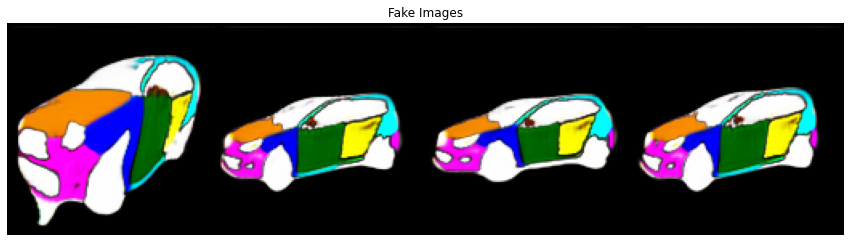

[1161/1500][51/52]	Loss_D: 0.0023	Loss_G: 7.0185	D(x): 1.0000	D(G(z)): 0.0023 / 0.0017
[1162/1500][51/52]	Loss_D: 0.0043	Loss_G: 7.6224	D(x): 0.9988	D(G(z)): 0.0032 / 0.0021
[1163/1500][51/52]	Loss_D: 0.0031	Loss_G: 6.8357	D(x): 1.0000	D(G(z)): 0.0031 / 0.0026
[1164/1500][51/52]	Loss_D: 0.0051	Loss_G: 5.5054	D(x): 1.0000	D(G(z)): 0.0051 / 0.0046
[1165/1500][51/52]	Loss_D: 0.0030	Loss_G: 5.9764	D(x): 1.0000	D(G(z)): 0.0029 / 0.0026
[1166/1500][51/52]	Loss_D: 0.0024	Loss_G: 6.9003	D(x): 0.9987	D(G(z)): 0.0011 / 0.0011
[1167/1500][51/52]	Loss_D: 0.0027	Loss_G: 6.2923	D(x): 1.0000	D(G(z)): 0.0027 / 0.0024
[1168/1500][51/52]	Loss_D: 0.3660	Loss_G: 9.4615	D(x): 0.7873	D(G(z)): 0.0000 / 0.0004
[1169/1500][51/52]	Loss_D: 0.0085	Loss_G: 9.2924	D(x): 0.9924	D(G(z)): 0.0008 / 0.0007
[1170/1500][51/52]	Loss_D: 0.0020	Loss_G: 22.4296	D(x): 0.9980	D(G(z)): 0.0000 / 0.0000
[1171/1500][51/52]	Loss_D: 0.0231	Loss_G: 5.2259	D(x): 1.0000	D(G(z)): 0.0227 / 0.0072
[1172/1500][51/52]	Loss_D: 0.1215	Loss_G: 

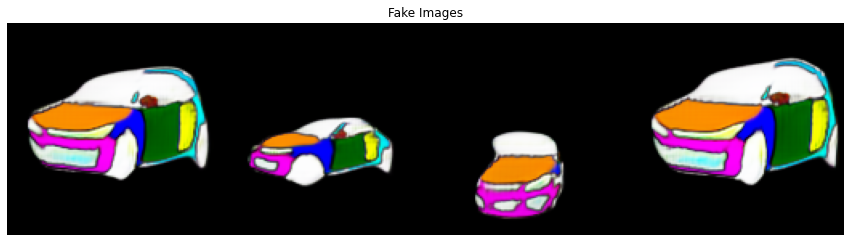

[1181/1500][51/52]	Loss_D: 0.0328	Loss_G: 13.2240	D(x): 0.9696	D(G(z)): 0.0004 / 0.0002
[1182/1500][51/52]	Loss_D: 0.0057	Loss_G: 5.8501	D(x): 1.0000	D(G(z)): 0.0056 / 0.0047
[1183/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.0315	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1184/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.4805	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[1185/1500][51/52]	Loss_D: 0.0204	Loss_G: 4.4542	D(x): 0.9978	D(G(z)): 0.0180 / 0.0131
[1186/1500][51/52]	Loss_D: 0.0033	Loss_G: 6.1859	D(x): 0.9999	D(G(z)): 0.0032 / 0.0023
[1187/1500][51/52]	Loss_D: 0.0114	Loss_G: 5.7526	D(x): 0.9931	D(G(z)): 0.0044 / 0.0039
[1188/1500][51/52]	Loss_D: 0.0020	Loss_G: 10.6915	D(x): 0.9980	D(G(z)): 0.0001 / 0.0001
[1189/1500][51/52]	Loss_D: 0.0030	Loss_G: 6.8876	D(x): 0.9991	D(G(z)): 0.0021 / 0.0018
[1190/1500][51/52]	Loss_D: 3.8093	Loss_G: 0.0039	D(x): 0.1610	D(G(z)): 0.0007 / 0.9961
[1191/1500][51/52]	Loss_D: 0.0338	Loss_G: 16.6411	D(x): 0.9679	D(G(z)): 0.0000 / 0.0000
[1192/1500][51/52]	Loss_D: 0.0004	Loss

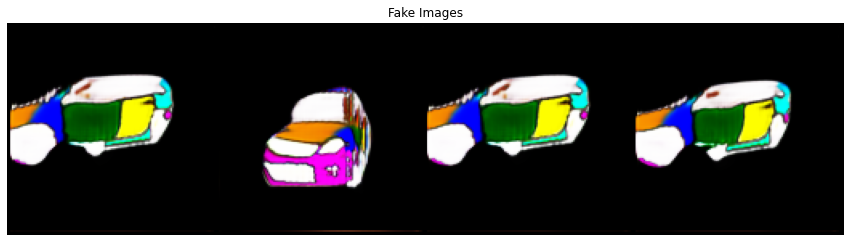

[1201/1500][51/52]	Loss_D: 0.0011	Loss_G: 8.8037	D(x): 1.0000	D(G(z)): 0.0011 / 0.0012
[1202/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.8949	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1203/1500][51/52]	Loss_D: 0.0030	Loss_G: 6.4833	D(x): 1.0000	D(G(z)): 0.0030 / 0.0024
[1204/1500][51/52]	Loss_D: 0.2848	Loss_G: 9.4218	D(x): 1.0000	D(G(z)): 0.2115 / 0.0001
[1205/1500][51/52]	Loss_D: 0.0081	Loss_G: 5.8455	D(x): 1.0000	D(G(z)): 0.0081 / 0.0034
[1206/1500][51/52]	Loss_D: 0.0027	Loss_G: 9.3883	D(x): 1.0000	D(G(z)): 0.0027 / 0.0016
[1207/1500][51/52]	Loss_D: 0.0098	Loss_G: 1.9022	D(x): 1.0000	D(G(z)): 0.0097 / 0.1576
[1208/1500][51/52]	Loss_D: 0.0305	Loss_G: 4.2789	D(x): 1.0000	D(G(z)): 0.0295 / 0.0279
[1209/1500][51/52]	Loss_D: 0.0044	Loss_G: 5.8235	D(x): 0.9999	D(G(z)): 0.0043 / 0.0037
[1210/1500][51/52]	Loss_D: 0.0007	Loss_G: 9.8899	D(x): 0.9994	D(G(z)): 0.0001 / 0.0001
[1211/1500][51/52]	Loss_D: 0.1033	Loss_G: 5.0533	D(x): 0.9998	D(G(z)): 0.0970 / 0.0067
[1212/1500][51/52]	Loss_D: 0.0046	Loss_G: 

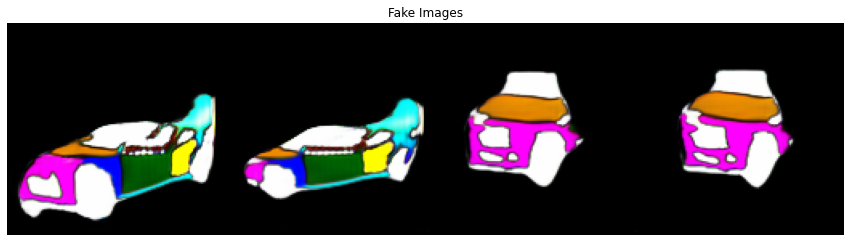

[1221/1500][51/52]	Loss_D: 0.0001	Loss_G: 12.9363	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1222/1500][51/52]	Loss_D: 0.0003	Loss_G: 9.1549	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[1223/1500][51/52]	Loss_D: 0.0030	Loss_G: 12.1904	D(x): 0.9971	D(G(z)): 0.0000 / 0.0000
[1224/1500][51/52]	Loss_D: 0.0003	Loss_G: 8.4602	D(x): 1.0000	D(G(z)): 0.0003 / 0.0008
[1225/1500][51/52]	Loss_D: 0.0001	Loss_G: 14.5699	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[1226/1500][51/52]	Loss_D: 0.0201	Loss_G: 7.1728	D(x): 0.9830	D(G(z)): 0.0025 / 0.0025
[1227/1500][51/52]	Loss_D: 0.0326	Loss_G: 25.5728	D(x): 0.9691	D(G(z)): 0.0000 / 0.0000
[1228/1500][51/52]	Loss_D: 0.0077	Loss_G: 5.0896	D(x): 1.0000	D(G(z)): 0.0077 / 0.0066
[1229/1500][51/52]	Loss_D: 0.0441	Loss_G: 5.6031	D(x): 0.9623	D(G(z)): 0.0050 / 0.0056
[1230/1500][51/52]	Loss_D: 0.0140	Loss_G: 5.5670	D(x): 0.9901	D(G(z)): 0.0040 / 0.0040
[1231/1500][51/52]	Loss_D: 0.0384	Loss_G: 6.4357	D(x): 0.9651	D(G(z)): 0.0012 / 0.0027
[1232/1500][51/52]	Loss_D: 0.0009	Loss_

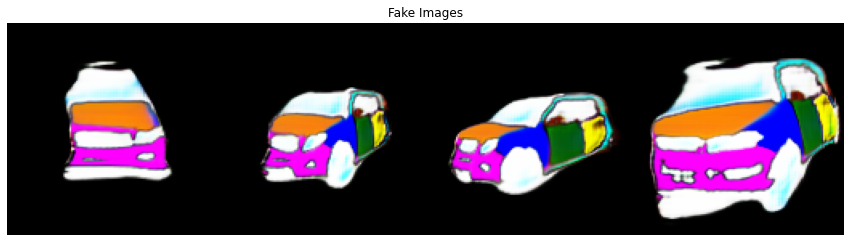

[1241/1500][51/52]	Loss_D: 0.0060	Loss_G: 6.7620	D(x): 0.9966	D(G(z)): 0.0025 / 0.0017
[1242/1500][51/52]	Loss_D: 0.0007	Loss_G: 9.8286	D(x): 0.9997	D(G(z)): 0.0004 / 0.0004
[1243/1500][51/52]	Loss_D: 0.0042	Loss_G: 6.2737	D(x): 1.0000	D(G(z)): 0.0042 / 0.0031
[1244/1500][51/52]	Loss_D: 0.0001	Loss_G: 13.1448	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1245/1500][51/52]	Loss_D: 0.0026	Loss_G: 6.5310	D(x): 1.0000	D(G(z)): 0.0026 / 0.0020
[1246/1500][51/52]	Loss_D: 0.2196	Loss_G: 3.2262	D(x): 0.9060	D(G(z)): 0.1006 / 0.0402
[1247/1500][51/52]	Loss_D: 0.0039	Loss_G: 6.5218	D(x): 1.0000	D(G(z)): 0.0039 / 0.0016
[1248/1500][51/52]	Loss_D: 0.1121	Loss_G: 3.8346	D(x): 0.9219	D(G(z)): 0.0246 / 0.0256
[1249/1500][51/52]	Loss_D: 0.0002	Loss_G: 9.1644	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[1250/1500][51/52]	Loss_D: 0.0002	Loss_G: 13.4309	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[1251/1500][51/52]	Loss_D: 0.0239	Loss_G: 6.8992	D(x): 0.9776	D(G(z)): 0.0007 / 0.0011
[1252/1500][51/52]	Loss_D: 2.2710	Loss_G:

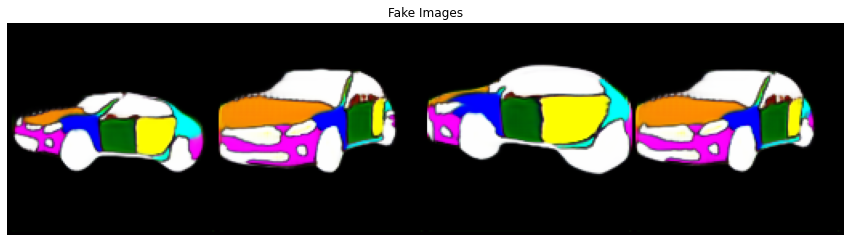

[1261/1500][51/52]	Loss_D: 0.0061	Loss_G: 6.4043	D(x): 1.0000	D(G(z)): 0.0060 / 0.0035
[1262/1500][51/52]	Loss_D: 0.0146	Loss_G: 7.1343	D(x): 0.9883	D(G(z)): 0.0027 / 0.0023
[1263/1500][51/52]	Loss_D: 0.0188	Loss_G: 5.0032	D(x): 0.9993	D(G(z)): 0.0178 / 0.0081
[1264/1500][51/52]	Loss_D: 0.0041	Loss_G: 7.1676	D(x): 1.0000	D(G(z)): 0.0040 / 0.0011
[1265/1500][51/52]	Loss_D: 0.0134	Loss_G: 6.3144	D(x): 0.9955	D(G(z)): 0.0088 / 0.0021
[1266/1500][51/52]	Loss_D: 0.0011	Loss_G: 7.1001	D(x): 1.0000	D(G(z)): 0.0011 / 0.0008
[1267/1500][51/52]	Loss_D: 0.0070	Loss_G: 5.5905	D(x): 0.9995	D(G(z)): 0.0065 / 0.0047
[1268/1500][51/52]	Loss_D: 0.0007	Loss_G: 8.0583	D(x): 0.9998	D(G(z)): 0.0005 / 0.0004
[1269/1500][51/52]	Loss_D: 0.0003	Loss_G: 8.3455	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[1270/1500][51/52]	Loss_D: 0.0003	Loss_G: 8.5014	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[1271/1500][51/52]	Loss_D: 0.0076	Loss_G: 5.8087	D(x): 0.9999	D(G(z)): 0.0075 / 0.0033
[1272/1500][51/52]	Loss_D: 0.0029	Loss_G: 7

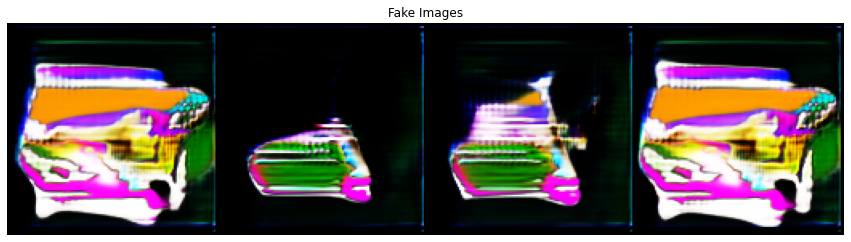

[1281/1500][51/52]	Loss_D: 0.0000	Loss_G: 15.9956	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1282/1500][51/52]	Loss_D: 0.0000	Loss_G: 14.0010	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
[1283/1500][51/52]	Loss_D: 0.0005	Loss_G: 11.0260	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[1284/1500][51/52]	Loss_D: 0.0009	Loss_G: 8.1243	D(x): 1.0000	D(G(z)): 0.0009 / 0.0003
[1285/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.3445	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[1286/1500][51/52]	Loss_D: 0.0000	Loss_G: 24.6049	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1287/1500][51/52]	Loss_D: 0.0005	Loss_G: 23.1113	D(x): 0.9995	D(G(z)): 0.0000 / 0.0000
[1288/1500][51/52]	Loss_D: 0.0000	Loss_G: 13.5302	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1289/1500][51/52]	Loss_D: 0.0000	Loss_G: 15.6985	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1290/1500][51/52]	Loss_D: 0.0056	Loss_G: 10.3362	D(x): 0.9957	D(G(z)): 0.0013 / 0.0003
[1291/1500][51/52]	Loss_D: 0.0002	Loss_G: 8.8023	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[1292/1500][51/52]	Loss_D: 0.0006	

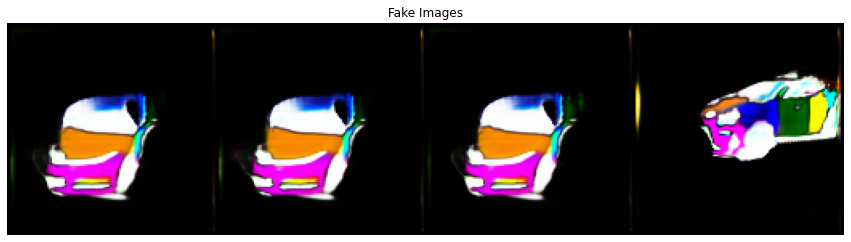

[1301/1500][51/52]	Loss_D: 0.0010	Loss_G: 7.2967	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[1302/1500][51/52]	Loss_D: 0.0045	Loss_G: 7.3661	D(x): 1.0000	D(G(z)): 0.0045 / 0.0035
[1303/1500][51/52]	Loss_D: 0.0039	Loss_G: 8.3382	D(x): 0.9972	D(G(z)): 0.0012 / 0.0009
[1304/1500][51/52]	Loss_D: 0.0139	Loss_G: 11.3986	D(x): 0.9863	D(G(z)): 0.0000 / 0.0000
[1305/1500][51/52]	Loss_D: 0.0000	Loss_G: 23.1916	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1306/1500][51/52]	Loss_D: 0.0227	Loss_G: 7.1635	D(x): 1.0000	D(G(z)): 0.0222 / 0.0014
[1307/1500][51/52]	Loss_D: 0.1359	Loss_G: 4.4073	D(x): 0.8963	D(G(z)): 0.0026 / 0.0154
[1308/1500][51/52]	Loss_D: 0.0005	Loss_G: 13.1235	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[1309/1500][51/52]	Loss_D: 0.0000	Loss_G: 17.6349	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1310/1500][51/52]	Loss_D: 0.0035	Loss_G: 5.9554	D(x): 1.0000	D(G(z)): 0.0035 / 0.0027
[1311/1500][51/52]	Loss_D: 0.0118	Loss_G: 4.9591	D(x): 0.9999	D(G(z)): 0.0116 / 0.0071
[1312/1500][51/52]	Loss_D: 0.0002	Loss_

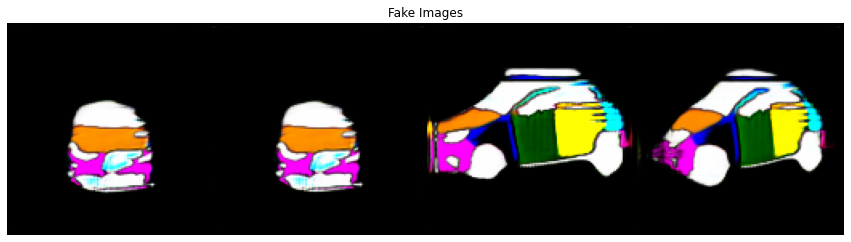

[1321/1500][51/52]	Loss_D: 0.0002	Loss_G: 13.4636	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[1322/1500][51/52]	Loss_D: 0.0038	Loss_G: 5.9766	D(x): 1.0000	D(G(z)): 0.0038 / 0.0031
[1323/1500][51/52]	Loss_D: 0.0034	Loss_G: 6.2639	D(x): 1.0000	D(G(z)): 0.0034 / 0.0030
[1324/1500][51/52]	Loss_D: 0.0005	Loss_G: 8.5303	D(x): 0.9998	D(G(z)): 0.0003 / 0.0003
[1325/1500][51/52]	Loss_D: 0.0012	Loss_G: 10.5998	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[1326/1500][51/52]	Loss_D: 0.0000	Loss_G: 12.4068	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1327/1500][51/52]	Loss_D: 0.0005	Loss_G: 9.3478	D(x): 0.9997	D(G(z)): 0.0002 / 0.0002
[1328/1500][51/52]	Loss_D: 0.0021	Loss_G: 11.7646	D(x): 1.0000	D(G(z)): 0.0020 / 0.0006
[1329/1500][51/52]	Loss_D: 0.0089	Loss_G: 7.2461	D(x): 1.0000	D(G(z)): 0.0088 / 0.0018
[1330/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.0821	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1331/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.2700	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1332/1500][51/52]	Loss_D: 0.0005	Los

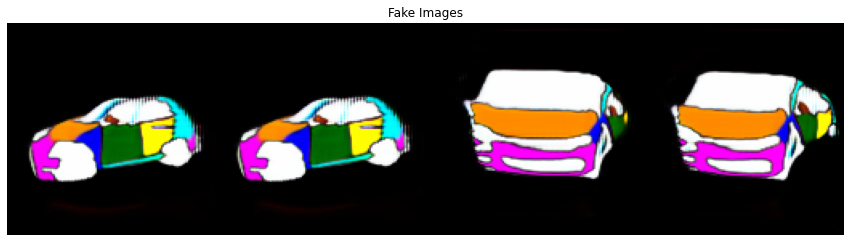

[1341/1500][51/52]	Loss_D: 0.0089	Loss_G: 5.7513	D(x): 1.0000	D(G(z)): 0.0088 / 0.0045
[1342/1500][51/52]	Loss_D: 0.0010	Loss_G: 10.4393	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[1343/1500][51/52]	Loss_D: 0.0020	Loss_G: 7.7688	D(x): 1.0000	D(G(z)): 0.0020 / 0.0017
[1344/1500][51/52]	Loss_D: 0.0606	Loss_G: 17.8768	D(x): 0.9450	D(G(z)): 0.0000 / 0.0000
[1345/1500][51/52]	Loss_D: 0.0004	Loss_G: 8.1687	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[1346/1500][51/52]	Loss_D: 0.0000	Loss_G: 13.0973	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1347/1500][51/52]	Loss_D: 0.0019	Loss_G: 6.8680	D(x): 1.0000	D(G(z)): 0.0019 / 0.0013
[1348/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.3273	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1349/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.7433	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1350/1500][51/52]	Loss_D: 0.0001	Loss_G: 12.6420	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[1351/1500][51/52]	Loss_D: 0.0013	Loss_G: 8.1602	D(x): 1.0000	D(G(z)): 0.0013 / 0.0008
[1352/1500][51/52]	Loss_D: 2.0629	Los

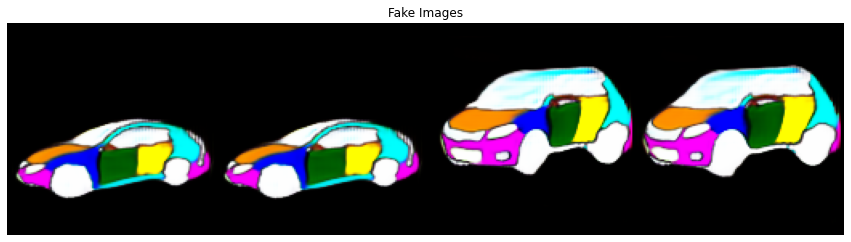

[1361/1500][51/52]	Loss_D: 0.0047	Loss_G: 5.6907	D(x): 1.0000	D(G(z)): 0.0046 / 0.0039
[1362/1500][51/52]	Loss_D: 0.0131	Loss_G: 5.0617	D(x): 0.9973	D(G(z)): 0.0104 / 0.0080
[1363/1500][51/52]	Loss_D: 0.0094	Loss_G: 5.3460	D(x): 0.9963	D(G(z)): 0.0057 / 0.0056
[1364/1500][51/52]	Loss_D: 0.0020	Loss_G: 7.1260	D(x): 1.0000	D(G(z)): 0.0020 / 0.0014
[1365/1500][51/52]	Loss_D: 0.0343	Loss_G: 8.4310	D(x): 0.9681	D(G(z)): 0.0003 / 0.0003
[1366/1500][51/52]	Loss_D: 0.0092	Loss_G: 7.0550	D(x): 1.0000	D(G(z)): 0.0091 / 0.0042
[1367/1500][51/52]	Loss_D: 0.0045	Loss_G: 6.4339	D(x): 0.9987	D(G(z)): 0.0032 / 0.0027
[1368/1500][51/52]	Loss_D: 0.0023	Loss_G: 7.9574	D(x): 1.0000	D(G(z)): 0.0023 / 0.0016
[1369/1500][51/52]	Loss_D: 0.0553	Loss_G: 7.5438	D(x): 1.0000	D(G(z)): 0.0497 / 0.0027
[1370/1500][51/52]	Loss_D: 0.0012	Loss_G: 7.1220	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[1371/1500][51/52]	Loss_D: 0.0004	Loss_G: 10.4977	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[1372/1500][51/52]	Loss_D: 0.0964	Loss_G: 

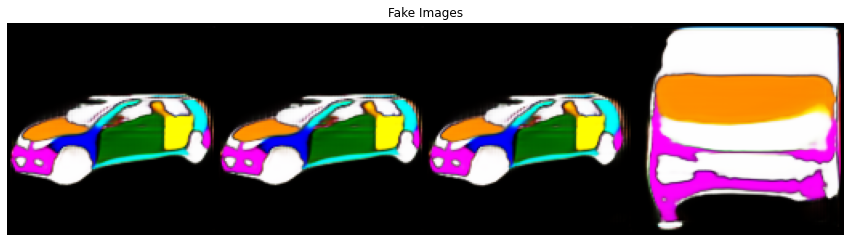

[1381/1500][51/52]	Loss_D: 0.0050	Loss_G: 6.8801	D(x): 1.0000	D(G(z)): 0.0050 / 0.0034
[1382/1500][51/52]	Loss_D: 0.0005	Loss_G: 7.8365	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[1383/1500][51/52]	Loss_D: 0.0003	Loss_G: 8.6419	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[1384/1500][51/52]	Loss_D: 0.0008	Loss_G: 7.8495	D(x): 0.9998	D(G(z)): 0.0006 / 0.0005
[1385/1500][51/52]	Loss_D: 0.0111	Loss_G: 5.2304	D(x): 0.9993	D(G(z)): 0.0104 / 0.0056
[1386/1500][51/52]	Loss_D: 0.0000	Loss_G: 12.5940	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1387/1500][51/52]	Loss_D: 0.0009	Loss_G: 7.5534	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[1388/1500][51/52]	Loss_D: 0.0000	Loss_G: 13.5808	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1389/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.4420	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[1390/1500][51/52]	Loss_D: 1.3461	Loss_G: 2.1387	D(x): 0.4606	D(G(z)): 0.0008 / 0.5836
[1391/1500][51/52]	Loss_D: 0.0012	Loss_G: 13.4157	D(x): 0.9988	D(G(z)): 0.0000 / 0.0000
[1392/1500][51/52]	Loss_D: 0.0009	Loss_

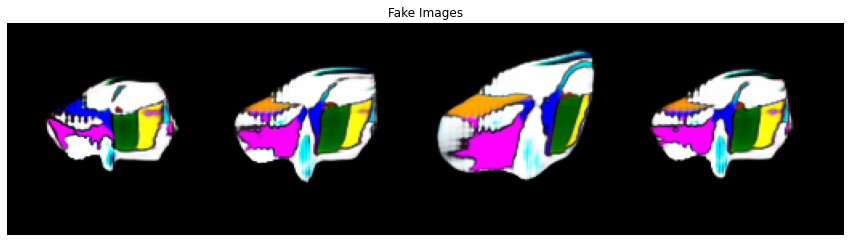

[1401/1500][51/52]	Loss_D: 0.0012	Loss_G: 7.8884	D(x): 1.0000	D(G(z)): 0.0012 / 0.0008
[1402/1500][51/52]	Loss_D: 0.0027	Loss_G: 6.2519	D(x): 1.0000	D(G(z)): 0.0027 / 0.0023
[1403/1500][51/52]	Loss_D: 0.0002	Loss_G: 9.1273	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1404/1500][51/52]	Loss_D: 0.0002	Loss_G: 9.7083	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[1405/1500][51/52]	Loss_D: 0.0016	Loss_G: 7.6396	D(x): 1.0000	D(G(z)): 0.0016 / 0.0014
[1406/1500][51/52]	Loss_D: 0.0021	Loss_G: 7.5254	D(x): 1.0000	D(G(z)): 0.0021 / 0.0077
[1407/1500][51/52]	Loss_D: 0.1215	Loss_G: 10.0633	D(x): 0.8963	D(G(z)): 0.0000 / 0.0000
[1408/1500][51/52]	Loss_D: 0.0001	Loss_G: 10.5124	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1409/1500][51/52]	Loss_D: 0.0120	Loss_G: 6.5574	D(x): 0.9902	D(G(z)): 0.0021 / 0.0018
[1410/1500][51/52]	Loss_D: 0.0015	Loss_G: 6.6201	D(x): 0.9999	D(G(z)): 0.0015 / 0.0014
[1411/1500][51/52]	Loss_D: 0.0021	Loss_G: 6.8621	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[1412/1500][51/52]	Loss_D: 0.0003	Loss_G:

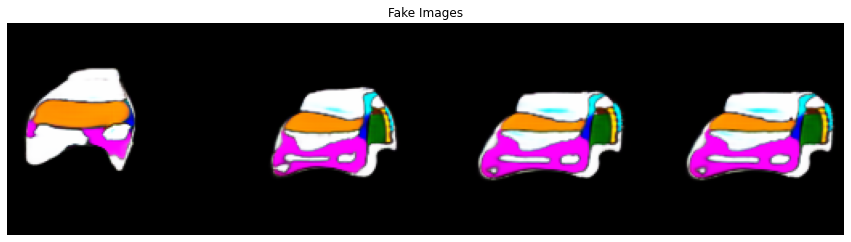

[1421/1500][51/52]	Loss_D: 0.0410	Loss_G: 8.7300	D(x): 0.9969	D(G(z)): 0.0363 / 0.0019
[1422/1500][51/52]	Loss_D: 0.0000	Loss_G: 15.4635	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1423/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.6011	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1424/1500][51/52]	Loss_D: 0.0007	Loss_G: 20.9596	D(x): 1.0000	D(G(z)): 0.0007 / 0.0005
[1425/1500][51/52]	Loss_D: 0.0008	Loss_G: 7.8350	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[1426/1500][51/52]	Loss_D: 0.0143	Loss_G: 5.3770	D(x): 1.0000	D(G(z)): 0.0142 / 0.0051
[1427/1500][51/52]	Loss_D: 0.0000	Loss_G: 32.0078	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1428/1500][51/52]	Loss_D: 0.0005	Loss_G: 8.2890	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[1429/1500][51/52]	Loss_D: 0.0068	Loss_G: 7.1419	D(x): 1.0000	D(G(z)): 0.0068 / 0.0039
[1430/1500][51/52]	Loss_D: 0.0046	Loss_G: 6.9224	D(x): 0.9971	D(G(z)): 0.0017 / 0.0014
[1431/1500][51/52]	Loss_D: 0.0547	Loss_G: 5.3051	D(x): 0.9996	D(G(z)): 0.0527 / 0.0053
[1432/1500][51/52]	Loss_D: 0.0065	Loss_G

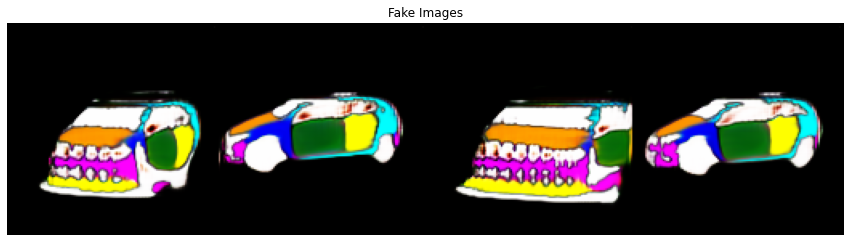

[1441/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.4339	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1442/1500][51/52]	Loss_D: 0.0006	Loss_G: 7.5948	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[1443/1500][51/52]	Loss_D: 0.0000	Loss_G: 23.0504	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1444/1500][51/52]	Loss_D: 0.0019	Loss_G: 6.8194	D(x): 1.0000	D(G(z)): 0.0018 / 0.0017
[1445/1500][51/52]	Loss_D: 0.0015	Loss_G: 10.8137	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[1446/1500][51/52]	Loss_D: 0.0003	Loss_G: 11.0575	D(x): 1.0000	D(G(z)): 0.0003 / 0.0010
[1447/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.2683	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1448/1500][51/52]	Loss_D: 0.0006	Loss_G: 8.4672	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[1449/1500][51/52]	Loss_D: 0.0002	Loss_G: 9.7181	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[1450/1500][51/52]	Loss_D: 0.0001	Loss_G: 11.2680	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[1451/1500][51/52]	Loss_D: 0.0011	Loss_G: 9.4807	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[1452/1500][51/52]	Loss_D: 0.0233	Loss

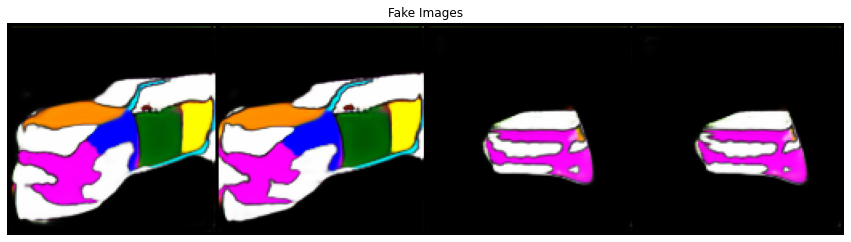

[1461/1500][51/52]	Loss_D: 0.0067	Loss_G: 6.7272	D(x): 1.0000	D(G(z)): 0.0067 / 0.0040
[1462/1500][51/52]	Loss_D: 0.0000	Loss_G: 11.6041	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1463/1500][51/52]	Loss_D: 0.0026	Loss_G: 16.9110	D(x): 1.0000	D(G(z)): 0.0026 / 0.0021
[1464/1500][51/52]	Loss_D: 0.0000	Loss_G: 18.9640	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1465/1500][51/52]	Loss_D: 0.0011	Loss_G: 8.4138	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[1466/1500][51/52]	Loss_D: 0.0000	Loss_G: 14.7566	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1467/1500][51/52]	Loss_D: 0.0037	Loss_G: 5.9252	D(x): 1.0000	D(G(z)): 0.0037 / 0.0029
[1468/1500][51/52]	Loss_D: 0.0000	Loss_G: 20.8595	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[1469/1500][51/52]	Loss_D: 0.0255	Loss_G: 11.7227	D(x): 0.9757	D(G(z)): 0.0000 / 0.0000
[1470/1500][51/52]	Loss_D: 0.0033	Loss_G: 5.9792	D(x): 1.0000	D(G(z)): 0.0033 / 0.0029
[1471/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.2925	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1472/1500][51/52]	Loss_D: 0.0005	Los

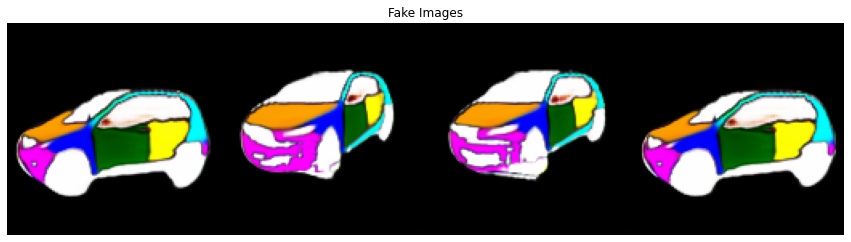

[1481/1500][51/52]	Loss_D: 0.0067	Loss_G: 8.9950	D(x): 0.9949	D(G(z)): 0.0016 / 0.0003
[1482/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.8650	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1483/1500][51/52]	Loss_D: 0.0035	Loss_G: 8.3047	D(x): 1.0000	D(G(z)): 0.0035 / 0.0027
[1484/1500][51/52]	Loss_D: 0.0022	Loss_G: 7.2077	D(x): 0.9996	D(G(z)): 0.0018 / 0.0011
[1485/1500][51/52]	Loss_D: 0.0141	Loss_G: 6.1202	D(x): 0.9975	D(G(z)): 0.0115 / 0.0063
[1486/1500][51/52]	Loss_D: 0.0503	Loss_G: 11.1480	D(x): 0.9594	D(G(z)): 0.0066 / 0.0069
[1487/1500][51/52]	Loss_D: 0.0101	Loss_G: 8.3215	D(x): 1.0000	D(G(z)): 0.0099 / 0.0059
[1488/1500][51/52]	Loss_D: 0.0007	Loss_G: 7.5868	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[1489/1500][51/52]	Loss_D: 0.0001	Loss_G: 9.6099	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[1490/1500][51/52]	Loss_D: 0.0962	Loss_G: 17.5920	D(x): 0.9178	D(G(z)): 0.0000 / 0.0000
[1491/1500][51/52]	Loss_D: 0.0005	Loss_G: 9.4547	D(x): 0.9995	D(G(z)): 0.0001 / 0.0001
[1492/1500][51/52]	Loss_D: 0.0113	Loss_G:

In [ ]:
# Training Loop

# Lists to keep track of progress
#img_list = []
G_losses = []
D_losses = []
fid_s = []
iters = 0
max=1000
print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    #for data,_ in dataloader:
    for i, data in enumerate(dataloader, 0):    

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        #label1 = torch.full((int(b_size/2),), real_label, dtype=torch.float, device=device) #half labels
        #real_cpu_1 = real_cpu[:int(b_size/2)]   #half real data
        #output1 = netD(real_cpu_1).view(-1)     # half real data pass from discriminator
        output = netD(real_cpu).view(-1) 
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        z = Variable(Tensor(np.random.normal(0, 1, (b_size, 100)))) #Normal batch size
        #z1 = Variable(Tensor(np.random.normal(0, 1, (int(b_size/2), 100)))) #Normal batch size
        # Generate fake image batch with G
        fake = netG(z)  #input for generator update
        #fake1 = netG(z1) #input for discriminator update
         #half fake generated
        
        label.fill_(fake_label)      #half fake labels
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)  #half output
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()    #discriminator has been trained on half real and half fake of the batch size
   
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        if (i+1) % 2 == 0:
            netG.zero_grad()
            label.fill_(real_label)  
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = netD(fake).view(-1)   #feeding here the full batch
            # Calculate G's loss based on this output
            errG = criterion(output, label)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG.step()

        # Output training stats
     # if i % 50 == 0:
       #   print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
       #         % (epoch, num_epochs, i, len(dataloader),
       #           errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
    #Calculatin adn fid average        
        
    if epoch % 1 == 0:
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                % (epoch, num_epochs, i, len(dataloader),
                  errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        G_losses.append( errG.item())
        D_losses.append(errD.item())
        fakes = fake_pre_process(fake)
        fid_new = []
        K = Variable(Tensor(np.random.normal(0, 1, (50, 100))))
        fakes = netG(K)
        fakes = fake_pre_process(fakes)
        fid = calculate_fid(model,fakes)
        fid_new.append(fid)
        fid = sum(fid_new)/len(fid_new) 
        fid_s.append(fid)  
        if fid<max:
            max = fid
            torch.save(netG.state_dict(), model_path+'model_1or_bs4_'+str(round(max,2))+'.pth')             

    if epoch % 20 ==0:

        # Check how the generator is doing by saving G's output on fixed_noise
        fake_imgs = vutils.make_grid(fake.detach().cpu(), padding=2, normalize=True)
        # Plot the real images
        plt.figure(figsize=(15,15))
        plt.axis("off")
        plt.title("Fake Images")
        plt.imshow(np.transpose(fake_imgs,(1,2,0)))
        plt.show()

            #img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
      

In [ ]:
label

tensor([1., 1., 1., 1.], device='cuda:0')

In [ ]:
metrics = '/content/drive/MyDrive/Deloite_Orientation1/metrics/g_up2_lr0002_bs4_or1/'

In [ ]:
cd drive/MyDrive/Deloite_Orientation1/

/content/drive/MyDrive/Deloite_Orientation1


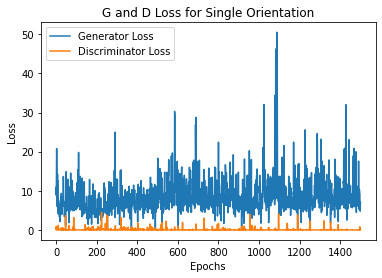

In [ ]:
plt.plot(G_losses, label = 'Generator Loss')
plt.plot(D_losses,label='Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='best')
plt.title('G and D Loss for Single Orientation')
plt.savefig('loss.png')

In [ ]:
import pandas as pd
pd.DataFrame(G_losses).to_csv(metrics+'gloss.csv')
pd.DataFrame(D_losses).to_csv(metrics+'dloss.csv')
pd.DataFrame(fid_s).to_csv(metrics+'fid.csv')


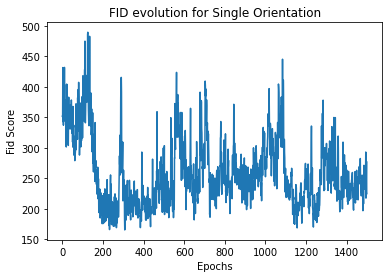

In [ ]:
plt.plot(fid_s)
plt.xlabel('Epochs')
plt.ylabel('Fid Score')
plt.title('FID evolution for Single Orientation')
plt.savefig('fid.png')

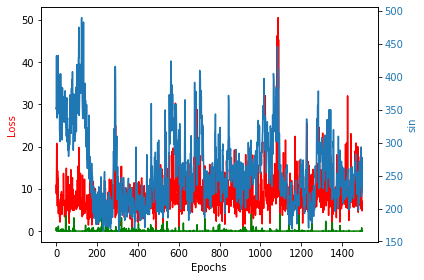

In [ ]:
# Create some mock data
t = np.arange(0.01, 10.0, 0.01)
data1 = np.exp(t)
data2 = np.sin(2 * np.pi * t)

fig, ax1 = plt.subplots()

ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss', color='red')
ax1.plot(G_losses, color='red')
ax1.plot(D_losses, color='green')
ax1.tick_params(axis='y')




ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('sin', color=color)  # we already handled the x-label with ax1
ax2.plot(fid_s, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [ ]:
fake_imgs = vutils.make_grid(fake.detach().cpu(), padding=2, normalize=True)
# Plot the real images
plt.figure(figsize=(15,15))
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(fake_imgs,(1,2,0)))
plt.show()

In [ ]:
fake_imgs = vutils.make_grid(imag_comb.detach().cpu(), padding=2, normalize=True)
# Plot the real images
plt.figure(figsize=(15,15))
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(fake_imgs,(1,2,0)))
plt.show()


In [ ]:
new_fakes = '/content/drive/MyDrive/Deloite_Orientation1/Fakes_generated/fake_all'
model = '/content/drive/MyDrive/Deloite_Orientation1/models_all/model_1or_bs8_160.47.pth'
ngpu=1
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
netG = Generator(ngpu).to(device)
netG.load_state_dict(torch.load(model))
netG.eval()

Generator(
  (l1): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=True)
  )
  (conv_blocks): Sequential(
    (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Sequential(
      (0): Upsample(scale_factor=2.0, mode=nearest)
      (1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
      (4): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): BatchNorm2d(512, eps=1e-05, momentum=0.1, af

In [ ]:
for i in range(280):
    noise = Variable(Tensor(np.random.normal(0, 1, (1, 100))))
    fake = netG(noise)    
    fake = vutils.make_grid(fake.detach().cpu(), padding=0, normalize=True)
    fake = fake.permute(1,2,0)
    fake = np.array(fake)
    cv2.imwrite(os.path.join(new_fakes, 'fake'+str(i)+'.jpg'),cv2.cvtColor(fake*255, cv2.COLOR_BGR2RGB))

In [ ]:
!pip install pytorch-fid

In [ ]:
import pytorch_fid 
from pytorch_fid import fid_score